# Preamble
**Name:** Deborah Djon</br>
**Student Number:** 22261972</br>
**Module Code:** CA694</br>
**Module Name:** Practicum</br>
**Supervisor:** Dr. Geoff Hamilton</br>

## **Plagiarism Policy**
I declare that this material, which I now submit for assessment, is entirely my own work and has not been taken from the work of others, save and to the extent that such work has been cited and acknowledged within the text of my work. I understand that plagiarism, collusion, and copying are grave and serious offences in the university and accept the penalties that would be imposed should I engage in plagiarism, collusion or copying. I have read and understood the Assignment Regulations. I have identified and included the source of all facts, ideas, opinions, and viewpoints of others in the assignment references. Direct quotations from books, journal articles, internet sources, module text, or any other source whatsoever are acknowledged and the source cited are identified in the assignment references. This assignment, or any part of it, has not been previously submitted by me or any other person for assessment on this or any other course of study.</br>

I have read and understood the referencing guidelines found at
http://www.dcu.ie/info/regulations/plagiarism.shtml,
https://www4.dcu.ie/students/az/plagiarism and/or recommended in the assignment
guidelines.

# Inspecting the Feasibility of Using Logistic Regression for Video Fingerprinting and Identification in and Open and Closed World Scenario

This Notebook is concerned with creating a Logistic Regression model to identify YouTube videos from byte-per time stamp time series. 

## Imports

### Libraries

In [508]:
import sys
sys.path.insert(0, '../../')

from modelling_utilities.constants import *
from modelling_utilities import data_processing


import warnings
import pandas as pd
import joblib

from statsmodels.stats.outliers_influence import variance_inflation_factor 
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score as AUC, accuracy_score as accuracy, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report

from tsfresh.utilities.dataframe_functions import impute

from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import RepeatedStratifiedKFold, cross_val_score, cross_validate, cross_val_predict

from IPython.display import clear_output

import os
import json
import re


from tsfresh.feature_extraction import ComprehensiveFCParameters
from tsfresh.feature_extraction import settings

from datetime import datetime
from tsfresh import extract_features, select_features 
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt



### Data

In [3]:
train_data = OPEN_WORLD_PROCESSED_DATA_FOLDER + "Train/Pre_Processed_Bin_Aggregates/data-1000-ms-aggregate.parquet"
test_data = OPEN_WORLD_PROCESSED_DATA_FOLDER + "Test/Pre_Processed_Bin_Aggregates/data-1000-ms-aggregate.parquet"
train_data_log = OPEN_WORLD_PROCESSED_DATA_FOLDER + "Train/Pre_Processed_Bin_Aggregates-log-scaled/data-1000-ms-aggregate-log-scaled.parquet"
test_data_log = OPEN_WORLD_PROCESSED_DATA_FOLDER + "Test/Pre_Processed_Bin_Aggregates-log-scaled/data-1000-ms-aggregate-log-scaled.parquet"

filename = META_DATA_FOLDER+"all_ids_dict.json"

with open(filename, "r") as json_file:
    pseudonym_video_id_map = json.load(json_file)

pseudonym_video_id_map = { v:int(k) for k,v in pseudonym_video_id_map.items()}
pseudonym_video_id_map["unknown"] = 999999
datasets = {
    "train":train_data,
    "test":test_data,
    "train_log": train_data_log,
    "test_log": test_data_log
}

for name, fp in datasets.items():
    dataset = data_processing.read_parquet_to_pandas(fp)
    dataset.reset_index(inplace=True, drop=True)
    dataset["video_id"] = dataset["video_id"].map(pseudonym_video_id_map)
    dataset["class"] = dataset["class"].map(pseudonym_video_id_map)
    dataset["class"] = dataset["class"]
    print(name)
    display(pd.concat([dataset.head(1), dataset.tail(1)]))
    datasets[name] = dataset


train


,ts,bpts,video_id,cw,class,ts_i,bpi,ts_f,bpi_sparse,df,df_sparse,mpdf,mpdf_sparse,sdf,sdf_sparse,ndf,ndf_sparse,adf,adf_sparse
0,"[2023-06-21T20:19:08.310000, 2023-06-21T20:19:...","[5863.0, 5863.0, 5949.0, 72940.0, 22823.0, 268...",3396,1,3396,"[2023-06-21T20:19:08.310000, 2023-06-21T20:19:...","[113438.0, 2961452.0, 20086.0, 3986507.0, 1790...","[2023-06-21T20:19:08.310000, 2023-06-21T20:19:...","[113438.0, 2961452.0, 20086.0, 0.0, 0.0, 0.0, ...","[25.106348842539536, -0.9932175162724232, 197....","[25.106348842539536, -0.9932175162724232, 197....","[0.961695141437376, -0.9932175162724232, 0.994...","[0.961695141437376, -0.9932175162724232, 0.994...","[2848014.0, -2941366.0, 3966421.0, -3984717.0,...","[2848014.0, -2941366.0, 3966421.0, 0.0, 0.0, 0...","[0.926216547583816, -0.9865264169029541, 0.989...","[0.926216547583816, -0.9865264169029541, 0.989...","[2848014.0, 2941366.0, 3966421.0, 3984717.0, 9...","[2848014.0, 2941366.0, 3966421.0, 0.0, 0.0, 0...."
2661,"[2023-06-27T14:26:48.420000, 2023-06-27T14:26:...","[5529.0, 61407.0, 4982.0, 6390.0, 701.0, 5862....",2466,0,999999,"[2023-06-27T14:26:48.420000, 2023-06-27T14:26:...","[5529.0, 61407.0, 11372.0, 96543.0, 23916.0, 4...","[2023-06-27T14:26:48.420000, 2023-06-27T14:26:...","[5529.0, 61407.0, 0.0, 0.0, 0.0, 11372.0, 0.0,...","[10.106348345089527, -0.8148093865520217, 7.48...","[10.106348345089527, -0.8148093865520217, 0.0,...","[0.9099614050515413, -0.8148093865520217, 0.88...","[0.9099614050515413, -0.8148093865520217, 0.0,...","[55878.0, -50035.0, 85171.0, -72627.0, 4102609...","[55878.0, -50035.0, 0.0, 0.0, 0.0, 85171.0, 0....","[0.8347974184295447, -0.6874922711221644, 0.78...","[0.8347974184295447, -0.6874922711221644, 0.0,...","[55878.0, 50035.0, 85171.0, 72627.0, 4102609.0...","[55878.0, 50035.0, 0.0, 0.0, 0.0, 85171.0, 0.0..."


test


,ts,bpts,video_id,cw,class,ts_i,bpi,ts_f,bpi_sparse,df,df_sparse,mpdf,mpdf_sparse,sdf,sdf_sparse,ndf,ndf_sparse,adf,adf_sparse
0,"[2023-06-21T21:28:23.770000, 2023-06-21T21:28:...","[0.0, 5863.0, 5863.0, 72787.0, 5672.0, 35037.0...",2861,1,2861,"[2023-06-21T21:28:34.090000, 2023-06-21T21:28:...","[90185.0, 205811.0, 2926755.0, 3946677.0, 1218...","[2023-06-21T21:28:34.090000, 2023-06-21T21:28:...","[90185.0, 0.0, 205811.0, 2926755.0, 0.0, 0.0, ...","[1.282097909851971, 13.220595594987634, 0.3484...","[1.282097909851971, 0.0, 13.220595594987634, 0...","[0.5618067061527323, 0.9296794572828952, 0.258...","[0.5618067061527323, 0.0, 0.9296794572828952, ...","[115626.0, 2720944.0, 1019922.0, -3934494.0, -...","[115626.0, 0.0, 2720944.0, 1019922.0, 0.0, 0.0...","[0.39063365721158394, 0.8685990973534157, 0.14...","[0.39063365721158394, 0.0, 0.8685990973534157,...","[115626.0, 2720944.0, 1019922.0, 3934494.0, 10...","[115626.0, 0.0, 2720944.0, 1019922.0, 0.0, 0.0..."
3499,"[2023-06-22T17:30:33.070000, 2023-06-22T17:30:...","[61146.0, 436491.0, 4856.0, 6390.0, 737.0, 996...",3007,0,999999,"[2023-06-22T17:30:33.070000, 2023-06-22T17:30:...","[61146.0, 436491.0, 11246.0, 10705.0, 1131480....","[2023-06-22T17:30:33.070000, 2023-06-22T17:30:...","[61146.0, 0.0, 0.0, 436491.0, 0.0, 0.0, 11246....","[6.138504562849573, -0.9742354366985803, -0.04...","[6.138504562849573, 0.0, 0.0, -0.9742354366985...","[0.8599146374152045, -0.9742354366985803, -0.0...","[0.8599146374152045, 0.0, 0.0, -0.974235436698...","[375345.0, -425245.0, -541.0, 1120775.0, -9572...","[375345.0, 0.0, 0.0, -425245.0, 0.0, 0.0, -541...","[0.7542546072739769, -0.9497651523103965, -0.0...","[0.7542546072739769, 0.0, 0.0, -0.949765152310...","[375345.0, 425245.0, 541.0, 1120775.0, 957277....","[375345.0, 0.0, 0.0, 425245.0, 0.0, 0.0, 541.0..."


train_log


,ts,bpts,video_id,cw,class,ts_i,bpi,ts_f,bpi_sparse,df,df_sparse,mpdf,mpdf_sparse,sdf,sdf_sparse,ndf,ndf_sparse,adf,adf_sparse
0,"[2023-06-21T20:19:08.310000, 2023-06-21T20:19:...","[5863.0, 5863.0, 5949.0, 72940.0, 22823.0, 268...",3396,1,3396,"[2023-06-21T20:19:08.310000, 2023-06-21T20:19:...","[11.639011711145091, 14.901190246565104, 9.907...","[2023-06-21T20:19:08.310000, 2023-06-21T20:19:...","[11.639011711145091, 14.901190246565104, 9.907...","[0.2802796849406269, -0.33510154759368016, 0.5...","[0.2802796849406269, -0.33510154759368016, 0.5...","[0.21892066884871714, -0.33510154759368016, 0....","[0.21892066884871714, -0.33510154759368016, 0....","[3.262178535420013, -4.993411912611819, 5.2906...","[3.262178535420013, -4.993411912611819, 5.2906...","[0.12291460858579929, -0.20127446638523175, 0....","[0.12291460858579929, -0.20127446638523175, 0....","[3.262178535420013, 4.993411912611819, 5.29064...","[3.262178535420013, 4.993411912611819, 5.29064..."
2661,"[2023-06-27T14:26:48.420000, 2023-06-27T14:26:...","[5529.0, 61407.0, 4982.0, 6390.0, 701.0, 5862....",2466,0,999999,"[2023-06-27T14:26:48.420000, 2023-06-27T14:26:...","[8.617762246337932, 11.025279114151642, 9.3389...","[2023-06-27T14:26:48.420000, 2023-06-27T14:26:...","[8.617762246337932, 11.025279114151642, 0.0, 0...","[0.2793668238917557, -0.15295482535369015, 0.2...","[0.2793668238917557, -0.15295482535369015, 0.0...","[0.21836334870865173, -0.15295482535369015, 0....","[0.21836334870865173, -0.15295482535369015, 0....","[2.40751686781371, -1.686369641380752, 2.13883...","[2.40751686781371, -1.686369641380752, 0.0, 0....","[0.1225633456464761, -0.0828105492238323, 0.10...","[0.1225633456464761, -0.0828105492238323, 0.0,...","[2.40751686781371, 1.686369641380752, 2.138834...","[2.40751686781371, 1.686369641380752, 0.0, 0.0..."


test_log


,ts,bpts,video_id,cw,class,ts_i,bpi,ts_f,bpi_sparse,df,df_sparse,mpdf,mpdf_sparse,sdf,sdf_sparse,ndf,ndf_sparse,adf,adf_sparse
0,"[2023-06-21T21:28:23.770000, 2023-06-21T21:28:...","[0.0, 5863.0, 5863.0, 72787.0, 5672.0, 35037.0...",2861,1,2861,"[2023-06-21T21:28:34.090000, 2023-06-21T21:28:...","[11.4096183951043, 12.234713550905097, 14.8894...","[2023-06-21T21:28:34.090000, 2023-06-21T21:28:...","[11.4096183951043, 0.0, 12.234713550905097, 14...","[0.072315753886636, 0.216980258407323, 0.02008...","[0.072315753886636, 0.0, 0.216980258407323, 0....","[0.06743886175739346, 0.17829398374242136, 0.0...","[0.06743886175739346, 0.0, 0.17829398374242136...","[0.8250951558007973, 2.6546913078149643, 0.298...","[0.8250951558007973, 0.0, 2.6546913078149643, ...","[0.03489610777267293, 0.09787198491483251, 0.0...","[0.03489610777267293, 0.0, 0.09787198491483251...","[0.8250951558007973, 2.6546913078149643, 0.298...","[0.8250951558007973, 0.0, 2.6546913078149643, ..."
3499,"[2023-06-22T17:30:33.070000, 2023-06-22T17:30:...","[61146.0, 436491.0, 4856.0, 6390.0, 737.0, 996...",3007,0,999999,"[2023-06-22T17:30:33.070000, 2023-06-22T17:30:...","[11.021019726056748, 12.986523035492528, 9.327...","[2023-06-22T17:30:33.070000, 2023-06-22T17:30:...","[11.021019726056748, 0.0, 0.0, 12.986523035492...","[0.17834132941335593, -0.2817347827929693, -0....","[0.17834132941335593, 0.0, 0.0, -0.28173478279...","[0.15134946467688118, -0.2817347827929693, -0....","[0.15134946467688118, 0.0, 0.0, -0.28173478279...","[1.96550330943578, -3.6587552466403803, -0.049...","[1.96550330943578, 0.0, 0.0, -3.65875524664038...","[0.0818702409054437, -0.1639646662061388, -0.0...","[0.0818702409054437, 0.0, 0.0, -0.163964666206...","[1.96550330943578, 3.6587552466403803, 0.04930...","[1.96550330943578, 0.0, 0.0, 3.658755246640380..."


### Logistic Regression Class and Functions for Modelling

Class and Functions to facilitate structured modelling, hyperparameter tuning in a strructured manner

In [3]:


class LogisticRegressionModeller():
    def __init__(self, 
                 data:pd.DataFrame = None,
                 features_file:str = None, 
                 train_file:str = None, 
                 test_file:str = None, 
                 feature_of_interest:str = None,
                 model_dir:str = None,
                 evaluation_folder:str = None,
                 data_ow_test:pd.DataFrame=None,
                 validation_proportion:float=0.2, 
                 fdr_level:float = 0.05):
        
        self.features_file = features_file
        self.train_file = train_file
        self.test_file = test_file
        if(isinstance(data_ow_test, pd.DataFrame) ):
            self.ow_test_file = str.replace(test_file, ".csv", "-ow.csv")
            self.ow=True
        else: 
            self.ow_test_file = None
            self.ow=False

        self.fdr_level = fdr_level
        self.data = data
        self.data_ow_test=data_ow_test
        self.data_transformed = None
        self.data_ow_test_transformed=None
        self.validation_proportion = validation_proportion
        self.validation_split_i = int(len(data)*validation_proportion)
        self.feature_of_interest = feature_of_interest
        self.model_dir = model_dir
        self.model = None
        self.model_fitted = None
        self.evaluation_folder = evaluation_folder
        self.features_dict=None
        self.features_list=None
    
    def _transform_any_data(self, vids_to_nums_map, data_in, feature_name=None):
        data = data_in 
        feature_of_interest = feature_name if isinstance(feature_name, str) else self.feature_of_interest
        
        cn = [self.feature_of_interest, "class"]
        data = data[cn]
        vids_to_nums_map["unknown"] = str(9999)
        data["class"] = data["class"].map(vids_to_nums_map)
        output_length = max(data[feature_of_interest].map(len))
        data[feature_of_interest]= data[feature_of_interest].apply(lambda array: data_processing.extend_list_with_fill_value(list(array), max_length=output_length, filling_value=1)) 

        #shuffle
        data = data.sample(len(data))
        data.reset_index(inplace=True, drop=True)

        data["id"] = data.index
        data.rename({"class": "target", self.feature_of_interest:0}, axis=1, inplace=True)

        y = data["target"]
        data.drop("target", axis = 1, inplace = True )

        # Explode the 'measurements' column
        exploded_df = data.explode(0)

        # Add the 'time' column
        exploded_df['time'] = exploded_df.groupby('id').cumcount()

        # Reset the index
        exploded_df.reset_index(drop=True, inplace=True)

        # Reorder the columns
        data = exploded_df[['id', 'time', 0]]
        data[0] = data[0].map(float)        
        return(data, y)

    def transform_data(self, vids_to_nums_map, data_in=None)-> None:
        data = data_in if isinstance(data_in, pd.DataFrame) else self.data
        transformed_data, target = self._transform_any_data(vids_to_nums_map=vids_to_nums_map, data_in=data)
        return (transformed_data, target )


    def extract_features_from_df(self, target, data, features_dict=None, ):
        start_time = datetime.now()
        
        features_fn =  self.features_file

        with warnings.catch_warnings():
            warnings.simplefilter( "ignore" )
            if(features_dict):
                f = extract_features( data, column_id = "id", column_sort = "time", default_fc_parameters = features_dict)
            else:
                f = extract_features( data, column_id = "id", column_sort = "time")

        impute( f )
        assert f.isnull().sum().sum() == 0
        f['y'] = target
        f = f.sample(len(f))

        if(features_dict is None):
            f.to_csv( features_file, index = None )

        end_time = datetime.now()
        exicution_time = end_time  - start_time
        m = int(exicution_time.seconds / 60)
        s = exicution_time.seconds % 60
        print(f"Features extracted and saved to: ", features_fn)
        print(f"Duration: {m}:{s}")

        return f

    #NOTE: can I give a name to the return variable as well?
     
    def train_test_split_from_features(self, features:pd.DataFrame, save_to_disk=False) ->tuple[ pd.DataFrame, pd.DataFrame]:
        start_time = datetime.now()

        validation_split_i = int(len(features)*(1-self.validation_proportion))
        
        features_ow = features[features["y"] == "unknown"]
        features = features[features["y"] != "unknown"]

        # Shuffle 
        train = features.iloc[:validation_split_i]
        train = train.sample(len(train))
        test = pd.concat([features.iloc[validation_split_i:], features_ow])
        test = test.sample(len(test))

        if(save_to_disk):
            print("saving {}".format( self.train_file ))
            train.to_csv( self.train_file, index = None )

            print("saving {}".format( self.test_file ))
            test.to_csv( self.test_file, index = None )

        end_time = datetime.now()
        exicution_time = end_time  - start_time
        m = int(exicution_time.seconds / 60)
        s = exicution_time.seconds % 60

        print(f"Duration: {m}:{s}")
        return train, test


    #NOTE: this function does not follow the single purpose principal. 
    def select_features_from_file(self)-> None:
        start_time = datetime.now()

        print("loading {}".format( self.features_file ))
        features = pd.read_csv( self.features_file )
        display(features.head(5))

        validation_split_i = int(len(features)*(1-self.validation_proportion))
        
        features_ow = features[features["y"] == "unknown"]
        features = features[features["y"] != "unknown"]

        # Shuffle
        train = features.iloc[:validation_split_i]
        train = train.sample(len(train))
        test = pd.concat([features.iloc[validation_split_i:], features_ow])
        test = test.sample(len(test))

        train_x = train.drop( 'y', axis = 1 )
        test_x = test.drop( 'y', axis = 1 )

        train_y = train.y
        test_y = test.y

        print("selecting features...")
        train_features_selected = select_features( train_x, train_y, fdr_level = self.fdr_level )

        print("selected {} features.".format( len( train_features_selected.columns )))

        train = train_features_selected.copy()
        train['y'] = train_y

        test = test_x[ train_features_selected.columns ].copy()
        test['y'] = test_y

        self.features_list = list(train_features_selected.columns)

        print("saving {}".format( self.train_file ))
        train.to_csv( self.train_file, index = None )

        print("saving {}".format( self.test_file ))
        test.to_csv( self.test_file, index = None )

        features_dict = settings.from_columns(train_x)["0"]
        self.features_dict = features_dict

        if(self.ow):
            data_trans, target = self.transform_data(data_in=self.data_ow_test, vids_to_nums_map=vids_to_nums_map)
            test_ow = self.extract_features_from_df(data=data_trans, target=target, features_dict=features_dict )
            y = test_ow.y
            test_ow = test_ow[ train_features_selected.columns ].copy()
            test_ow["y"] = y
            print("saving {}".format( self.ow_test_file ))
            test_ow.to_csv( self.ow_test_file, index = None )
            

        end_time = datetime.now()
        exicution_time = end_time  - start_time
        m = int(exicution_time.seconds / 60)
        s = exicution_time.seconds % 60

        print(f"Duration: {m}:{s}")

        

        return features_dict

    def key_encoder(obj):
        """
        Custom JSON encoder function to convert numeric keys represented as strings to actual numbers.
        """
        if isinstance(obj, str):
            if obj.isnumeric():
                return int(obj)
        return obj
    
    def train(self, onevsrest=False, cross_val=False, train_df=None):
        start_time = datetime.now()
        train = train_df if isinstance(train_df, pd.DataFrame) else pd.read_csv( self.train_file )

        x_train = train.drop( 'y', axis = 1 ).values
        y_train = train.y.values

        if(onevsrest):
            model = OneVsRestClassifier(LogisticRegression())
        else:
            model = LogisticRegression(multi_class='multinomial', solver='lbfgs',  max_iter=2000)
        print("Model created.")

        # define the model evaluation procedure
        scoring = ['precision_macro', 'recall_macro', 'accuracy', 'f1_macro']
        cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

        scaler = StandardScaler().fit(x_train)
        x_train_scaled = scaler.transform(x_train)

        #train_fn = re.search(r"/Train/(.*)", self.train_file).group(1)

        if(cross_val):
            print("Begin validation")
            # evaluate the model and collect the scores
            train_scores = cross_validate(model, x_train_scaled, y_train, scoring=scoring, cv=cv, n_jobs=-1)
            train_scores_dict = {str.replace(k, "test_", ""):{
            "mean": np.mean(train_scores[k]),
            "std": np.std(train_scores[k])
            }
                for k in train_scores.keys()
            }
            evaluation_train_fn = self.evaluation_folder+str(start_time.timestamp)+train_fn[:-10]+"-eval-train.json"
            with open(evaluation_train_fn, "w") as f: 
                json.dump(train_scores_dict, f, indent=4, sort_keys=True, default=self.key_encoder)
            print("Validation complete")

        self.model = model

        print("Fitting model")
        results = model.fit(x_train_scaled, y_train)
        self.model_fitted = model
        print("Fitting complete")
        model_fn = self.model_dir+str(start_time.timestamp)+train_fn[:-10]+"-lr-model.joblib"
        joblib.dump(model, model_fn)
        print("Model saved as: ", model_fn)
     
        end_time = datetime.now()
        exicution_time = end_time  - start_time
        m = int(exicution_time.seconds / 60)
        s = exicution_time.seconds % 60
        print(f"Training completed in: {m}:{s}")
        return ( model, pd.DataFrame(train_scores_dict)) if(cross_val) else (model, results)

    def evaluate(self, model, vids_to_nums_map, ow=False): 
        if(ow):
            test_fp = self.ow_test_file
            test = pd.read_csv( test_fp )
            
        else:
            test_fp = self.test_file
            test = pd.read_csv( test_fp )

        x_test = test.drop( 'y', axis = 1 ).values
        y_test = test.y.values
        
        scaler = StandardScaler().fit(x_test)
        x_test_scaled = scaler.transform(x_test)
        predictions = model.predict(x_test_scaled)
        report = classification_report(y_test, predictions, output_dict=True)
        accuracy = accuracy_score(y_test, predictions)
        report["weighted avg"]["accuracy"] = accuracy
        v_ids = list(set(vids_to_nums_map.values()) and set(y_test))
        cm = confusion_matrix(y_test, predictions, labels = v_ids )
        cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        report["cm"] = cm_normalized.tolist()
        test_fn = re.search(r"/Test/(.*)", test_fp).group(1)
        evaluation_test_fn = self.evaluation_folder+test_fn[:-9]+"-eval-test.json"
        with open(evaluation_test_fn, "w") as f: 
            json.dump(report, f, indent=4, sort_keys=True, default=self.key_encoder)
        del report["cm"]
        return pd.DataFrame(report).T

In [4]:
"""
Sources: 
- https://machinelearningmastery.com/one-vs-rest-and-one-vs-one-for-multi-class-classification/
- https://towardsdatascience.com/assumptions-of-logistic-regression-clearly-explained-44d85a22b290
- https://github.com/blue-yonder/tsfresh/blob/main/notebooks
"""

class LogisticRegressionModeller():
    def __init__(self, 
                video_id_map:dict,
                data:pd.DataFrame = None,
                features_file:str = None, 
                train_file:str = None, 
                test_file:str = None, 
                feature_of_interest:str = None,
                model_dir:str = None,
                evaluation_folder:str = None,
                data_ow_test:pd.DataFrame=None,
                validation_proportion:float=0.2, 
                fdr_level:float = 0.05):

                self.video_id_map = video_id_map
    def transform_data(self, data_frame: pd.DataFrame, feature_name:str)-> pd.DataFrame:
        """
        Function to transform dta into the TS fresh library needed format of columns [id, 0]
        @param: data_frame: data input to transform, contains column: "class" with class names
        @param: feature_name: the name of the fingerprinting feature that should be used for data transformation
        @return: transformed data frame with columns: [id, 0]
        """
        data = data_frame.copy()
        columns = [feature_name, "class"]
        data = data_frame[columns]
        output_length = max(data[feature_name].map(len))
        data[feature_name]= data[feature_name].apply(lambda array: data_processing.extend_list_with_fill_value(list(array), max_length=output_length, filling_value=1)) 
        #shuffle
        data = data.sample(len(data))
        data.reset_index(inplace=True, drop=True)
        data["id"] = data.index
        data.rename({"class": "target", feature_name:0}, axis=1, inplace=True)
        y = data["target"]
        data.drop("target", axis = 1, inplace = True )
        # Explode the 'measurements' column
        exploded_df = data.explode(0)

        exploded_df['time'] = exploded_df.groupby('id').cumcount()
        exploded_df.reset_index(drop=True, inplace=True)

        # Reorder the columns
        data = exploded_df[['id', 'time', 0]]
        data[0] = data[0].map(float)     

        return(data, y)
    
    def train_test_split(self, train_frame:pd.DataFrame, test_frame:pd.DataFrame, test_prop:float=0.2, ow:bool=False, ow_count:int=300, seed:int=42)->tuple[pd.DataFrame, pd.DataFrame]:
        """Split data into train and test set. 
        @param train_frame: train data
        @paran test_frame: test data
        @param cw:  closed world. trainingset only contains closed_world traces
        @param test_prop: percentage of traces that should be considered for the test set
        @param ow_count: number of traces to be considered in the open_world training set 
        """
        np.random.seed(seed)

        unknown_id = self.video_id_map["unknown"]        
        
        cw_train_data = train_frame[train_frame["class"]!=unknown_id]
        
        if(ow==True):
            ow_train_data = train_frame[train_frame["class"]==unknown_id]
            ow_sample = ow_train_data.sample(ow_count)
            train = pd.concat([cw_train_data, ow_sample])
            train = train.sample(len(train))
            return train, test_frame
        else:
            cw_test_data = test_frame[test_frame["class"]!=unknown_id]
            return cw_train_data, cw_test_data
        
    def extract_features_from_df(self, data_frame:pd.DataFrame, target:pd.DataFrame, features_dict=None, file_path:str=None) -> pd.DataFrame:
        """Extract time series featrues from dataframe. 
        @param data_frame: given dataframe to extract features from. In required format columns = ["id", 0]
        @param target: y_variable
        @param features_dict: if a defined set of features is known, provide a dictionary of features
        @param file_path: path to save features file to
        @return: features data frame
        """
        start_time = datetime.now()
        
        with warnings.catch_warnings():
            warnings.simplefilter( "ignore" )
            if(type(features_dict))==dict:
                f = extract_features( data_frame, column_id = "id", column_sort = "time", default_fc_parameters = features_dict)
            else:
                f = extract_features( data_frame, column_id = "id", column_sort = "time")
            print("Features extracted")
        impute( f )
        assert f.isnull().sum().sum() == 0
        f['y'] = target
        f = f.sample(len(f))



        if(type(file_path) == str):
            f.to_csv( file_path, index = None )
            print(f"Features saved to: ", file_path)


        end_time = datetime.now()
        exicution_time = end_time  - start_time
        m = int(exicution_time.seconds / 60)
        s = exicution_time.seconds % 60
        print(f"Duration: {m}:{s}")

        return f
    
    def select_features_from_df(self, features_frame:pd.DataFrame, fdr_level:float= 0.05)-> tuple[pd.DataFrame, dict]:
        """
        Use TS fresh automatic feature selection to extract relevant features for model
        @param features_frame: features dataframe
        @return: tuple of dataframe and dictionary describing selected features
        
        
        """
        start_time = datetime.now()
        features = features_frame.drop( "y", axis = 1 )
        y = features_frame["y"]

        print("selecting features...")
        features_selected = select_features( features, y, fdr_level = fdr_level )
        print("selected {} features.".format( len( features_selected.columns )))

        # print("saving {}".format( self.train_file ))
        # train.to_csv( self.train_file, index = None )

        features_dict = settings.from_columns(features)["0"]

        end_time = datetime.now()
        exicution_time = end_time  - start_time
        m = int(exicution_time.seconds / 60)
        s = exicution_time.seconds % 60
        print(f"Duration: {m}:{s}")

        return features_selected, features_dict


### Create a Baseline Model

- Create a baseline One-vs-rest logistic regression model for the open and closed world with a decision threshold to identify the negative class
- Use 1000ms binned dataset according to data analysis results
- Use SDF and MPDF fingerprints according to data analysis results




#### Data Transformation
The data requires a specific format for the TS fresh library. This step performs the required data transformations. 

In [598]:
log_reg_modeller = LogisticRegressionModeller(video_id_map=pseudonym_video_id_map)

train, test = log_reg_modeller.train_test_split(train_frame=datasets["train"], test_frame=datasets["test"])

train_trans, train_target = log_reg_modeller.transform_data(train, "sdf")

#features = log_reg_modeller.extract_features_from_df(train_trans, train_target)

# x = StandardScaler().fit_transform(features)
# pca = PCA()
# principalComponents = pca.fit_transform(x, features.y)

features2 = log_reg_modeller.extract_features_from_df(train_trans, train_target, better_features_dict)

selected_features, features_dict = log_reg_modeller.select_features_from_df(features2)


/tmp/ipykernel_61974/1372174324.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[feature_name]= data[feature_name].apply(lambda array: data_processing.extend_list_with_fill_value(list(array), max_length=output_length, filling_value=1))


Feature Extraction: 100%|██████████| 15/15 [00:08<00:00,  1.81it/s]


Features extracted
Duration: 0:8
selecting features...
selected 76 features.
Duration: 0:4


In [6]:
def show_start_and_end_of_df(df: pd.DataFrame, n:int=1)-> None:
    """
    print head and tail of df
    @param df: dataframe
    @param n: nrows
    """
    display(pd.concat([df.head(n), df.tail(n)]))

In [7]:
print(len(train))
show_start_and_end_of_df(train)

print(len(test))
show_start_and_end_of_df(test)


2000


,ts,bpts,video_id,cw,class,ts_i,bpi,ts_f,bpi_sparse,df,df_sparse,mpdf,mpdf_sparse,sdf,sdf_sparse,ndf,ndf_sparse,adf,adf_sparse
0,"[2023-06-21T20:19:08.310000, 2023-06-21T20:19:...","[5863.0, 5863.0, 5949.0, 72940.0, 22823.0, 268...",3396,1,3396,"[2023-06-21T20:19:08.310000, 2023-06-21T20:19:...","[113438.0, 2961452.0, 20086.0, 3986507.0, 1790...","[2023-06-21T20:19:08.310000, 2023-06-21T20:19:...","[113438.0, 2961452.0, 20086.0, 0.0, 0.0, 0.0, ...","[25.106348842539536, -0.9932175162724232, 197....","[25.106348842539536, -0.9932175162724232, 197....","[0.961695141437376, -0.9932175162724232, 0.994...","[0.961695141437376, -0.9932175162724232, 0.994...","[2848014.0, -2941366.0, 3966421.0, -3984717.0,...","[2848014.0, -2941366.0, 3966421.0, 0.0, 0.0, 0...","[0.926216547583816, -0.9865264169029541, 0.989...","[0.926216547583816, -0.9865264169029541, 0.989...","[2848014.0, 2941366.0, 3966421.0, 3984717.0, 9...","[2848014.0, 2941366.0, 3966421.0, 0.0, 0.0, 0...."
1999,"[2023-06-26T13:50:48.250000, 2023-06-26T13:50:...","[0.0, 73382.0, 5599.0, 34081.0, 126024.0, 2682...",912,1,912,"[2023-06-26T13:50:58.800000, 2023-06-26T13:51:...","[78981.0, 195401.0, 19862.0, 2896042.0, 227924...","[2023-06-26T13:50:58.800000, 2023-06-26T13:51:...","[78981.0, 195401.0, 19862.0, 0.0, 0.0, 0.0, 0....","[1.4740253985135665, -0.8983526184615227, 144....","[1.4740253985135665, -0.8983526184615227, 144....","[0.5958004309087467, -0.8983526184615227, 0.99...","[0.5958004309087467, -0.8983526184615227, 0.99...","[116420.0, -175539.0, 2876180.0, -616802.0, -2...","[116420.0, -175539.0, 2876180.0, 0.0, 0.0, 0.0...","[0.4242989700490557, -0.8154629453273438, 0.98...","[0.4242989700490557, -0.8154629453273438, 0.98...","[116420.0, 175539.0, 2876180.0, 616802.0, 2259...","[116420.0, 175539.0, 2876180.0, 0.0, 0.0, 0.0,..."


500


,ts,bpts,video_id,cw,class,ts_i,bpi,ts_f,bpi_sparse,df,df_sparse,mpdf,mpdf_sparse,sdf,sdf_sparse,ndf,ndf_sparse,adf,adf_sparse
0,"[2023-06-21T21:28:23.770000, 2023-06-21T21:28:...","[0.0, 5863.0, 5863.0, 72787.0, 5672.0, 35037.0...",2861,1,2861,"[2023-06-21T21:28:34.090000, 2023-06-21T21:28:...","[90185.0, 205811.0, 2926755.0, 3946677.0, 1218...","[2023-06-21T21:28:34.090000, 2023-06-21T21:28:...","[90185.0, 0.0, 205811.0, 2926755.0, 0.0, 0.0, ...","[1.282097909851971, 13.220595594987634, 0.3484...","[1.282097909851971, 0.0, 13.220595594987634, 0...","[0.5618067061527323, 0.9296794572828952, 0.258...","[0.5618067061527323, 0.0, 0.9296794572828952, ...","[115626.0, 2720944.0, 1019922.0, -3934494.0, -...","[115626.0, 0.0, 2720944.0, 1019922.0, 0.0, 0.0...","[0.39063365721158394, 0.8685990973534157, 0.14...","[0.39063365721158394, 0.0, 0.8685990973534157,...","[115626.0, 2720944.0, 1019922.0, 3934494.0, 10...","[115626.0, 0.0, 2720944.0, 1019922.0, 0.0, 0.0..."
499,"[2023-06-06T16:56:18.260000, 2023-06-06T16:56:...","[0.0, 5860.0, 5860.0, 57708.0, 6111.0, 11321.0...",1287,1,1287,"[2023-06-06T16:56:28.870000, 2023-06-06T16:56:...","[120814.0, 276035.0, 2788218.0, 15475.0, 1728....","[2023-06-06T16:56:28.870000, 2023-06-06T16:56:...","[120814.0, 276035.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.2847931531113943, 9.100958211820965, -0.994...","[1.2847931531113943, 9.100958211820965, 0.0, 0...","[0.562323618381727, 0.9009994914314448, -0.994...","[0.562323618381727, 0.9009994914314448, 0.0, 0...","[155221.0, 2512183.0, -2772743.0, -13747.0, 39...","[155221.0, 2512183.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[0.3911336553701786, 0.8198353726014138, -0.98...","[0.3911336553701786, 0.8198353726014138, 0.0, ...","[155221.0, 2512183.0, 2772743.0, 13747.0, 397....","[155221.0, 2512183.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."


In [551]:
len(features.columns)

784

In [552]:
len(selected_features.columns)

369

In [560]:
y_train = features.y
x_train = selected_features
x_train

,"0__cwt_coefficients__coeff_6__w_5__widths_(2, 5, 10, 20)","0__cwt_coefficients__coeff_7__w_5__widths_(2, 5, 10, 20)","0__cwt_coefficients__coeff_5__w_5__widths_(2, 5, 10, 20)","0__fft_coefficient__attr_""real""__coeff_2","0__agg_autocorrelation__f_agg_""median""__maxlag_40",0__number_peaks__n_1,"0__cwt_coefficients__coeff_14__w_5__widths_(2, 5, 10, 20)",0__index_mass_quantile__q_0.9,"0__fft_coefficient__attr_""angle""__coeff_1","0__cwt_coefficients__coeff_13__w_5__widths_(2, 5, 10, 20)",...,0__ar_coefficient__coeff_1__k_10,"0__cwt_coefficients__coeff_0__w_20__widths_(2, 5, 10, 20)",0__benford_correlation,0__value_count__value_0,"0__fft_coefficient__attr_""angle""__coeff_13",0__max_langevin_fixed_point__m_3__r_30,0__friedrich_coefficients__coeff_0__m_3__r_30,0__friedrich_coefficients__coeff_2__m_3__r_30,0__friedrich_coefficients__coeff_1__m_3__r_30,0__friedrich_coefficients__coeff_3__m_3__r_30
1829,-3.186549e+05,-2.721863e+05,-3.196938e+05,8.327524e+05,-0.000031,2.0,1.066071e+05,0.115385,77.228198,9.361314e+04,...,2.001161e-01,-8.881635e+03,0.919862,1.0,180.0,4.778187e+06,1.807037e-14,-2.561744,-9.347565e-09,423794.225714
409,1.931365e+05,2.226706e+05,1.235304e+05,-9.828006e+05,-0.002958,4.0,-3.644505e+04,0.384615,-159.279306,1.186172e+05,...,5.600632e-02,-1.633702e+05,0.940302,0.0,0.0,4.778187e+06,1.807037e-14,-2.561744,-9.347565e-09,423794.225714
1513,-2.182811e+05,-2.056046e+05,-2.068374e+05,4.565332e+05,-0.002678,4.0,6.880508e+04,0.192308,131.571843,1.165654e+05,...,-5.587935e-09,-1.799106e+05,0.934215,0.0,180.0,4.778187e+06,1.807037e-14,-2.561744,-9.347565e-09,423794.225714
863,-1.325249e+04,-2.512501e+05,2.153871e+05,4.960895e+05,-0.000006,3.0,-2.433994e+05,0.384615,18.586725,-5.551152e+05,...,5.509066e-01,8.759138e+04,0.936228,0.0,0.0,4.778187e+06,1.807037e-14,-2.561744,-9.347565e-09,423794.225714
1867,4.850223e+06,8.194753e+06,1.411072e+06,-1.096758e+07,-0.032011,4.0,1.688518e+06,0.384615,-125.525844,5.183376e+06,...,-2.415367e-22,4.265720e+06,0.932866,0.0,180.0,4.778187e+06,1.807037e-14,-2.561744,-9.347565e-09,423794.225714
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
459,2.440005e+05,5.574814e+05,-7.190891e+03,1.571002e+06,-0.010582,4.0,5.982847e+05,0.423077,-125.234026,9.405279e+05,...,-2.219432e-02,6.942168e+05,0.971083,0.0,0.0,4.778187e+06,1.807037e-14,-2.561744,-9.347565e-09,423794.225714
1447,-4.348459e+05,-5.731179e+05,-2.411552e+05,2.409450e+06,-0.006386,4.0,4.549396e+05,0.500000,49.401047,7.486007e+04,...,1.040096e-02,1.163486e+05,0.913040,0.0,180.0,4.778187e+06,1.807037e-14,-2.561744,-9.347565e-09,423794.225714
1472,-1.946112e+05,-2.888494e+05,-2.337748e+04,2.970267e+06,-0.004824,5.0,1.518282e+05,0.423077,-14.267387,1.518901e+05,...,-1.292127e-01,4.091557e+05,0.981134,0.0,0.0,4.778187e+06,1.807037e-14,-2.561744,-9.347565e-09,423794.225714
260,1.948577e+06,2.244580e+06,1.462827e+06,-5.223496e+06,-0.021368,3.0,-6.672234e+05,0.307692,-94.025538,-2.305571e+05,...,3.333333e-01,1.052066e+06,0.912624,0.0,180.0,4.778187e+06,1.807037e-14,-2.561744,-9.347565e-09,423794.225714


#### Closed-World Model

In [601]:
models = {}
# Simple OVA classifier for OW and CW, compare performance with these features
for p in [0.0001, 0.001, 0.01, 0.1, 1.0]:

    model = OneVsRestClassifier(LogisticRegression( max_iter=2000, penalty="l2", C=p))
    #model = LogisticRegression(multi_class='multinomial', solver='lbfgs',  max_iter=2000)

    # define the model evaluation procedure
    scoring = ['precision_macro', 'recall_macro', 'accuracy', 'f1_macro']
    cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)

    scaler = StandardScaler().fit(x_train)
    x_train_scaled = scaler.transform(x_train)

    # evaluate the model and collect the scores
    train_scores = cross_validate(estimator=model, X=x_train_scaled, y=y_train.apply(int), scoring=scoring, cv=cv, n_jobs=-1)
    train_scores_dict = {str.replace(k, "test_", ""):{
                            "mean": np.mean(train_scores[k]),
                            "std": np.std(train_scores[k])
                            }
                            for k in train_scores.keys()
                        }
    print("Validation of C = ", p)
    display(pd.DataFrame(train_scores_dict).T)
    models[p] = {"score":train_scores,"model":model}
    print("Validation complete")

/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels w

Validation of C =  0.0001


/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,mean,std
fit_time,3.601291,0.634628
score_time,0.023065,0.007803
precision_macro,0.031926,0.016851
recall_macro,0.038562,0.005958
accuracy,0.145362,0.004620
f1_macro,0.019817,0.006846


Validation complete


/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels w

Validation of C =  0.001


,mean,std
fit_time,3.884402,0.892028
score_time,0.031923,0.018500
precision_macro,0.406548,0.025576
recall_macro,0.347810,0.023902
accuracy,0.417391,0.020316
f1_macro,0.330012,0.022865


Validation complete


/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels w

Validation of C =  0.01


,mean,std
fit_time,5.455999,1.288896
score_time,0.025467,0.007579
precision_macro,0.562981,0.025745
recall_macro,0.533671,0.022686
accuracy,0.577971,0.019181
f1_macro,0.524168,0.023779


Validation complete


/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Validation of C =  0.1


,mean,std
fit_time,11.274320,2.707021
score_time,0.021651,0.004906
precision_macro,0.660279,0.023912
recall_macro,0.635523,0.021359
accuracy,0.665797,0.017794
f1_macro,0.631809,0.023333


Validation complete
Validation of C =  1.0


,mean,std
fit_time,23.238541,5.561238
score_time,0.020544,0.005140
precision_macro,0.680619,0.017006
recall_macro,0.659248,0.017576
accuracy,0.678551,0.014504
f1_macro,0.655755,0.017345


Validation complete


In [602]:

print("Fitting model")
results = model.fit(x_train_scaled, y_train.apply(int))
print("Fitting complete")

Fitting model
Fitting complete


In [603]:
pd.DataFrame(train_scores_dict)

,fit_time,score_time,precision_macro,recall_macro,accuracy,f1_macro
mean,23.238541,0.020544,0.680619,0.659248,0.678551,0.655755
std,5.561238,0.005140,0.017006,0.017576,0.014504,0.017345


In [604]:
test_trans, test_target = log_reg_modeller.transform_data(test, "sdf")
features_test = log_reg_modeller.extract_features_from_df(data_frame=test_trans, target=test_target , features_dict=features_dict)
features_test = features_test[list(selected_features.columns ) + ["y"]]
y_test = features_test.y#.apply(int)
x_test = features_test.drop("y", axis=1)

/tmp/ipykernel_61974/1372174324.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[feature_name]= data[feature_name].apply(lambda array: data_processing.extend_list_with_fill_value(list(array), max_length=output_length, filling_value=1))


Feature Extraction: 100%|██████████| 15/15 [00:01<00:00,  8.33it/s]

Features extracted
Duration: 0:2



/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning: The columns ['0__fft_coefficient__attr_"angle"__coeff_11'
 '0__fft_coefficient__attr_"angle"__coeff_12'
 '0__fft_coefficient__attr_"angle"__coeff_10'
 '0__ar_coefficient__coeff_4__k_10' '0__ar_coefficient__coeff_8__k_10'
 '0__ar_coefficient__coeff_6__k_10' '0__ar_coefficient__coeff_7__k_10'
 '0__ar_coefficient__coeff_3__k_10' '0__ar_coefficient__coeff_5__k_10'
 '0__ar_coefficient__coeff_9__k_10' '0__partial_autocorrelation__lag_9'] did not have any finite values. Filling with zeros.
  warnings.warn(


In [605]:
scaler = StandardScaler().fit(x_test)
x_test_scaled = scaler.transform(x_test)
predictions = results.predict(x_test_scaled)
report = classification_report(y_test, predictions, output_dict=True)
accuracy = accuracy_score(y_test, predictions)

# report["weighted avg"]["accuracy"] = accuracy
v_ids = list(set(pseudonym_video_id_map.values()) and set(y_test))
cm = confusion_matrix(y_test, predictions, labels = v_ids )
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
# report["cm"] = cm_normalized.tolist()
# test_fn = re.search(r"/Test/(.*)", test_fp).group(1)
# evaluation_test_fn = self.evaluation_folder+test_fn[:-9]+"-eval-test.json"
# with open(evaluation_test_fn, "w") as f: 
plt.subplots(figsize=(14, 14))

sns.heatmap(cm_normalized, yticklabels=v_ids, xticklabels=v_ids)

ValueError: X has 76 features, but LogisticRegression is expecting 372 features as input.

In [569]:
pd.DataFrame(report).T

,precision,recall,f1-score,support
415,0.636364,0.700,0.666667,10.000
758,1.000000,0.800,0.888889,10.000
773,0.750000,0.600,0.666667,10.000
872,1.000000,0.300,0.461538,10.000
912,1.000000,0.800,0.888889,10.000
940,0.818182,0.900,0.857143,10.000
964,0.750000,0.900,0.818182,10.000
1017,1.000000,0.800,0.888889,10.000
1115,0.800000,0.800,0.800000,10.000
1195,0.571429,0.400,0.470588,10.000


#### Open-World Model

In [588]:
# Make Datasets
#  Train
train, test = log_reg_modeller.train_test_split(train_frame=datasets["train"], test_frame=datasets["test"], ow=True)
#train = train[train["class"] != 999999]
train_trans, train_target = log_reg_modeller.transform_data(train, "mpdf")
features = log_reg_modeller.extract_features_from_df(train_trans, train_target)
selected_features, features_dict = log_reg_modeller.select_features_from_df(features)
y_train = features.y
x_train = selected_features

# Test
test_trans, test_target = log_reg_modeller.transform_data(test, "mpdf")
features_test = log_reg_modeller.extract_features_from_df(data_frame=test_trans, target=test_target )
features_test = features_test[list(selected_features.columns ) + ["y"]]
y_test = features_test.y
x_test = features_test.drop("y", axis=1)

/tmp/ipykernel_61974/1372174324.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[feature_name]= data[feature_name].apply(lambda array: data_processing.extend_list_with_fill_value(list(array), max_length=output_length, filling_value=1))


Feature Extraction: 100%|██████████| 15/15 [00:27<00:00,  1.80s/it]


Features extracted


/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning: The columns ['0__fft_coefficient__attr_"real"__coeff_14'
 '0__fft_coefficient__attr_"real"__coeff_15'
 '0__fft_coefficient__attr_"real"__coeff_16'
 '0__fft_coefficient__attr_"real"__coeff_17'
 '0__fft_coefficient__attr_"real"__coeff_18'
 '0__fft_coefficient__attr_"real"__coeff_19'
 '0__fft_coefficient__attr_"real"__coeff_20'
 '0__fft_coefficient__attr_"real"__coeff_21'
 '0__fft_coefficient__attr_"real"__coeff_22'
 '0__fft_coefficient__attr_"real"__coeff_23'
 '0__fft_coefficient__attr_"real"__coeff_24'
 '0__fft_coefficient__attr_"real"__coeff_25'
 '0__fft_coefficient__attr_"real"__coeff_26'
 '0__fft_coefficient__attr_"real"__coeff_27'
 '0__fft_coefficient__attr_"real"__coeff_28'
 '0__fft_coefficient__attr_"real"__coeff_29'
 '0__fft_coefficient__attr_"real"__coeff_30'
 '0__fft_coefficient__attr_"real"__coeff_

Duration: 0:29
selecting features...
selected 372 features.
Duration: 0:19


/tmp/ipykernel_61974/1372174324.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[feature_name]= data[feature_name].apply(lambda array: data_processing.extend_list_with_fill_value(list(array), max_length=output_length, filling_value=1))
Feature Extraction: 100%|██████████| 15/15 [00:40<00:00,  2.68s/it]


Features extracted


/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning: The columns ['0__fft_coefficient__attr_"real"__coeff_15'
 '0__fft_coefficient__attr_"real"__coeff_16'
 '0__fft_coefficient__attr_"real"__coeff_17'
 '0__fft_coefficient__attr_"real"__coeff_18'
 '0__fft_coefficient__attr_"real"__coeff_19'
 '0__fft_coefficient__attr_"real"__coeff_20'
 '0__fft_coefficient__attr_"real"__coeff_21'
 '0__fft_coefficient__attr_"real"__coeff_22'
 '0__fft_coefficient__attr_"real"__coeff_23'
 '0__fft_coefficient__attr_"real"__coeff_24'
 '0__fft_coefficient__attr_"real"__coeff_25'
 '0__fft_coefficient__attr_"real"__coeff_26'
 '0__fft_coefficient__attr_"real"__coeff_27'
 '0__fft_coefficient__attr_"real"__coeff_28'
 '0__fft_coefficient__attr_"real"__coeff_29'
 '0__fft_coefficient__attr_"real"__coeff_30'
 '0__fft_coefficient__attr_"real"__coeff_31'
 '0__fft_coefficient__attr_"real"__coeff_

Duration: 0:43


In [593]:
def predict_with_threshold(clf, X, threshold=0.5):
    probas = clf.predict_proba(X)
    # find the class with the highest predicted probability
    max_probas = np.max(probas, axis=1)
    # only classify as positive if the max probability is above the threshold
    y_pred = np.where(max_probas >= threshold, clf.classes_[np.argmax(probas, axis=1)], 999999)
    return y_pred

model = OneVsRestClassifier(LogisticRegression( penalty='l2', max_iter=2000, C=0.1))
# define the model evaluation procedure
scoring = ['precision_macro', 'recall_macro', 'accuracy', 'f1_macro']
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

scaler = StandardScaler().fit(x_train)
x_train_scaled = scaler.transform(x_train)

# evaluate the model and collect the scores
train_scores = cross_validate(estimator=model, X=x_train_scaled, y=y_train.apply(int), scoring=scoring, cv=cv, n_jobs=-1)
train_scores_dict = {str.replace(k, "test_", ""):{
                        "mean": np.mean(train_scores[k]),
                        "std": np.std(train_scores[k])
                        }
                        for k in train_scores.keys()
                    }

model.fit(X=x_train_scaled, y=y_train)

# make predictions with a higher threshold for the positive class
y_pred_train = predict_with_threshold(model, x_train_scaled, threshold=0.3)
pd.DataFrame(train_scores_dict).T#.plot()

/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels w

,mean,std
fit_time,13.862966,1.277665
score_time,0.017519,0.005305
precision_macro,0.678832,0.043160
recall_macro,0.648725,0.037048
accuracy,0.676377,0.033049
f1_macro,0.639750,0.040035


In [594]:
# Test once on entire train set 
accuracy = accuracy_score(y_train, y_pred_train)
print(f"Accuracy: {accuracy:.2f}")
recall = recall_score(y_train, y_pred_train, average="macro")
print(f"Recall: {recall:.2f}")
precision = precision_score(y_train, y_pred_train, average="macro")
print(f"Recall: {precision:.2f}")
f1 = f1_score(y_train, y_pred_train, average="macro")
print(f"F1: {f1:.2f}")



Accuracy: 0.86
Recall: 0.84
Recall: 0.92
F1: 0.87


/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels w

<Axes: >

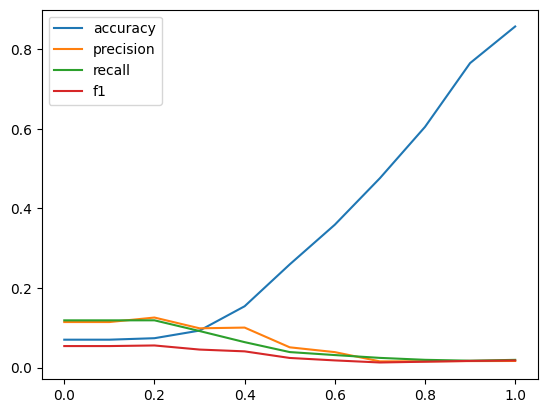

In [595]:
# make predictions with a higher threshold for the positive class
x_test_scaled = scaler.transform(x_test)

results = {}
for t in range(11):
    th = t/10
    y_pred_test = predict_with_threshold(model, x_test_scaled, threshold=th)

    accuracy = accuracy_score(y_test, y_pred_test)
    recall = recall_score(y_test, y_pred_test, average="macro")
    precision = precision_score(y_test, y_pred_test, average="macro")
    f1 = f1_score(y_test, y_pred_test, average="macro")
    results[th] = {
        "accuracy":accuracy,
           "precision":precision,
           "recall":recall,
           "f1":f1,
    }
results = pd.DataFrame(results).T
results.plot()

In [596]:
results

,accuracy,precision,recall,f1
0.0,0.070286,0.114594,0.118863,0.054255
0.1,0.070286,0.114594,0.118863,0.054255
0.2,0.074000,0.125919,0.118948,0.055772
0.3,0.093143,0.098869,0.092026,0.045465
0.4,0.154286,0.100689,0.064111,0.040970
0.5,0.259429,0.051116,0.039157,0.024385
0.6,0.359143,0.039041,0.031667,0.018231
0.7,0.476000,0.015794,0.024569,0.013027
0.8,0.604857,0.016022,0.019699,0.014943
0.9,0.765143,0.016523,0.017503,0.016999


### Feature Engineering

For logistic regression the features must have low multicolinearity, there should be less correlation between the features and the residuals should be normally distributed. Althoug a reduction from 784 to 355 is a lot, 355 featurers are still quite a bit. We are now examining, if we can reduce that more. 

In [316]:
selected_features

,"0__change_quantiles__f_agg_""mean""__isabs_True__qh_1.0__ql_0.4","0__change_quantiles__f_agg_""mean""__isabs_True__qh_0.8__ql_0.4","0__change_quantiles__f_agg_""var""__isabs_True__qh_1.0__ql_0.4","0__change_quantiles__f_agg_""var""__isabs_True__qh_0.8__ql_0.4","0__change_quantiles__f_agg_""var""__isabs_False__qh_1.0__ql_0.4","0__change_quantiles__f_agg_""var""__isabs_False__qh_0.8__ql_0.4","0__change_quantiles__f_agg_""mean""__isabs_True__qh_0.6__ql_0.4","0__change_quantiles__f_agg_""var""__isabs_False__qh_0.6__ql_0.4","0__change_quantiles__f_agg_""var""__isabs_True__qh_0.6__ql_0.4","0__change_quantiles__f_agg_""mean""__isabs_False__qh_0.8__ql_0.4",...,"0__fft_coefficient__attr_""real""__coeff_13","0__fft_coefficient__attr_""imag""__coeff_12","0__fft_coefficient__attr_""angle""__coeff_7","0__fft_coefficient__attr_""imag""__coeff_3",0__partial_autocorrelation__lag_3,"0__fft_coefficient__attr_""imag""__coeff_11","0__cwt_coefficients__coeff_6__w_2__widths_(2, 5, 10, 20)","0__fft_coefficient__attr_""abs""__coeff_5","0__fft_coefficient__attr_""real""__coeff_8",0__value_count__value_0
1829,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,...,-0.743121,-0.037010,-37.755752,2.269099,0.317308,0.207048,-0.527737,0.918573,0.152387,1.0
409,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,...,1.561149,2.400116,-151.604852,0.061463,0.597340,-2.146232,-0.208424,1.560577,-5.712221,0.0
1513,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,...,-5.290293,-2.273196,176.142287,-1.016367,0.004887,-3.933999,-0.650956,0.498571,-1.574819,0.0
863,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,...,2.105348,0.842103,-107.629407,2.445542,0.636836,1.001317,0.100194,0.676392,-5.023793,0.0
1867,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,...,-4.201293,-1.252601,131.895588,-0.788518,0.204979,-1.796644,-1.215643,1.505288,1.087947,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
459,0.000018,0.000018,4.350680e-09,4.350680e-09,4.350680e-09,4.350680e-09,0.000018,4.350680e-09,4.350680e-09,0.000018,...,5.975927,4.465349,91.865035,-0.440950,0.320488,-1.809739,-0.874560,1.727423,0.848769,0.0
1447,0.000031,0.000031,1.073109e-08,1.073109e-08,1.073109e-08,1.073109e-08,0.000031,1.073109e-08,1.073109e-08,0.000031,...,-4.225279,-2.355504,-6.389653,4.525556,0.270523,3.260573,0.350504,2.253085,-0.343895,0.0
1472,0.000036,0.000036,1.843734e-08,1.843734e-08,1.843734e-08,1.843734e-08,0.000036,1.843734e-08,1.843734e-08,0.000036,...,3.758825,4.442751,-73.001662,-0.225649,0.361355,-0.729567,-0.305899,0.972923,-3.185622,0.0
260,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,...,1.347214,-0.475720,139.544871,1.809451,0.271089,1.246670,-0.794689,0.685656,-1.428529,0.0


#### Multicolinearity

In [317]:
# VIF sccores

def calc_vif(df):
    vif = pd.DataFrame()
    vif["variables"] = df.columns
    vif_list = [] 
    for i in range(df.shape[1]):
        if i %20 ==0: print(f"Progress: {round(i/df.shape[1]*100)}%")
        if i %20 ==19: clear_output()
        vif_list.append(variance_inflation_factor(df.values, i) )
    vif["VIF"] = vif_list
    return(vif)


In [318]:
vif_scores = calc_vif(selected_features)
vif_scores.sort_values("VIF", ascending=False) 


Progress: 96%


,variables,VIF
106,0__mean_abs_change,42188.190962
108,"0__change_quantiles__f_agg_""mean""__isabs_True_...",42025.444566
76,"0__cwt_coefficients__coeff_9__w_20__widths_(2,...",37902.650550
48,"0__cwt_coefficients__coeff_9__w_10__widths_(2,...",36999.922023
69,0__cwt_coefficients__coeff_11__w_20__widths_(2...,34797.327452
...,...,...
155,0__partial_autocorrelation__lag_6,1.164279
354,0__value_count__value_0,1.057644
299,0__partial_autocorrelation__lag_9,1.020798
282,0__partial_autocorrelation__lag_8,1.003806


In [319]:
low_vif_features = vif_scores["variables"][vif_scores["VIF"]<10]
selected_features_2 = selected_features[low_vif_features]
vif_scores_2 = calc_vif(selected_features_2)
vif_scores_2.sort_values("VIF", ascending=False) 

Progress: 84%


,variables,VIF
20,0__approximate_entropy__m_2__r_0.7,7.925910
47,0__approximate_entropy__m_2__r_0.5,6.164863
44,"0__agg_linear_trend__attr_""stderr""__chunk_len_...",5.362747
19,0__approximate_entropy__m_2__r_0.9,4.891525
53,0__fourier_entropy__bins_3,4.493589
...,...,...
87,0__partial_autocorrelation__lag_8,1.002806
85,0__index_mass_quantile__q_0.8,0.643103
9,"0__agg_linear_trend__attr_""intercept""__chunk_l...",0.069415
33,0__minimum,0.023708


In [320]:
low_vif_features = vif_scores_2["variables"]

#### Correlation

In [321]:
low_vif_features_df = selected_features[low_vif_features]
correlation_matrix = low_vif_features_df.corr()

<Axes: >

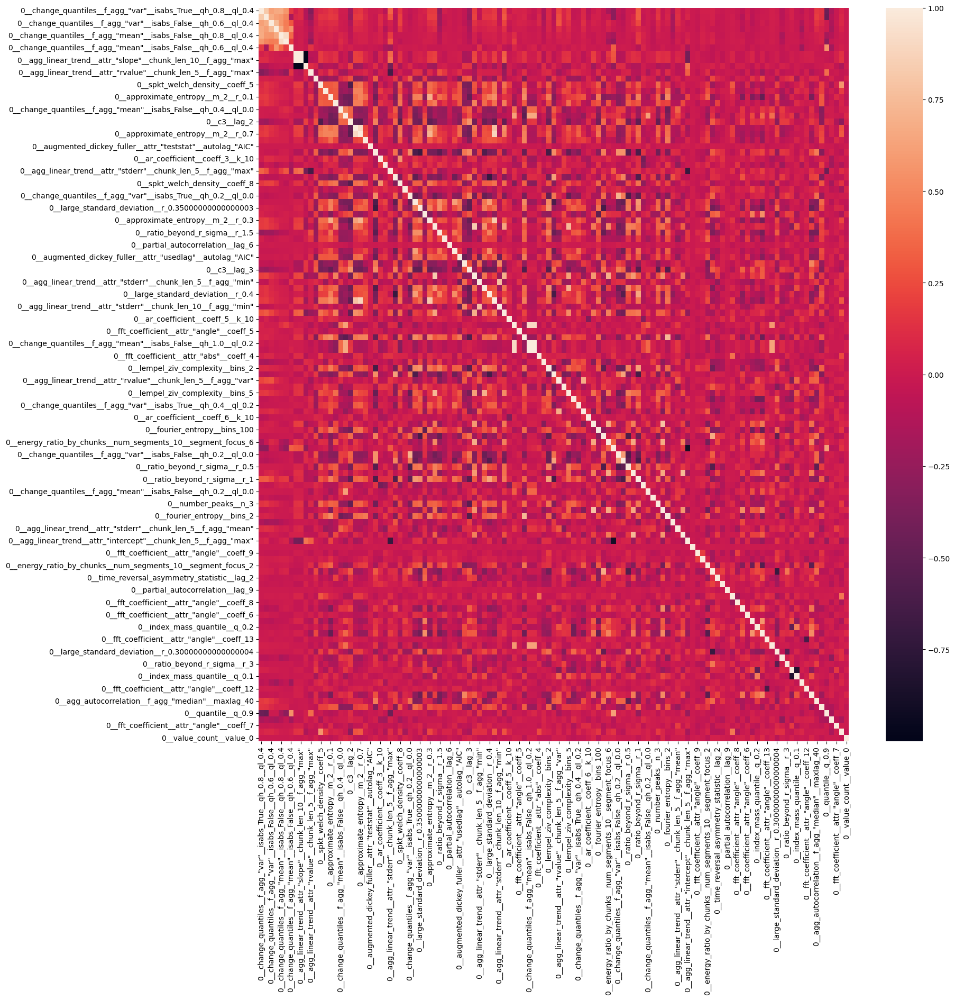

In [322]:
plt.figure(figsize=(18,18))
sns.heatmap(correlation_matrix)


In [323]:
# Source: ChatGPT
# Find the variables with the highest correlation
n = len(correlation_matrix.columns)
correlation_pairs = []

for i in range(n):
    for j in range(i + 1, n):
        feature1, feature2 = correlation_matrix.columns[i], correlation_matrix.columns[j]
        correlation = correlation_matrix.iloc[i, j]
        correlation_pairs.append((feature1, feature2, correlation))

# Sort the correlation pairs by absolute correlation (highest to lowest)
correlation_pairs.sort(key=lambda x: abs(x[2]), reverse=True)

# Print the pairs with the highest correlation coefficients
num_pairs_to_display = 20  # Change this value to display more or fewer pairs
for i in range(min(num_pairs_to_display, len(correlation_pairs))):
    feature1, feature2, correlation = correlation_pairs[i]
    print(f"{feature1} - {feature2}: {correlation:.4f}")

0__agg_linear_trend__attr_"slope"__chunk_len_10__f_agg_"max" - 0__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"max": -0.9997
0__change_quantiles__f_agg_"mean"__isabs_False__qh_1.0__ql_0.2 - 0__change_quantiles__f_agg_"mean"__isabs_False__qh_0.8__ql_0.2: 0.9976
0__agg_linear_trend__attr_"stderr"__chunk_len_10__f_agg_"max" - 0__agg_linear_trend__attr_"slope"__chunk_len_10__f_agg_"max": 0.9930
0__agg_linear_trend__attr_"stderr"__chunk_len_10__f_agg_"max" - 0__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"max": -0.9899
0__change_quantiles__f_agg_"mean"__isabs_False__qh_0.8__ql_0.4 - 0__change_quantiles__f_agg_"mean"__isabs_False__qh_1.0__ql_0.4: 0.9190
0__change_quantiles__f_agg_"mean"__isabs_False__qh_0.6__ql_0.2 - 0__change_quantiles__f_agg_"mean"__isabs_False__qh_0.8__ql_0.2: 0.9089
0__change_quantiles__f_agg_"mean"__isabs_False__qh_0.6__ql_0.2 - 0__change_quantiles__f_agg_"mean"__isabs_False__qh_1.0__ql_0.2: 0.9071
0__approximate_entropy__m_2__r_0.9 - 0__approxim

In [324]:
high_correlation_features = [cp[0] for cp in correlation_pairs if abs(cp[2])>0.6]
print(len(high_correlation_features))

69


In [325]:
keep_features = list(set(low_vif_features) - set(high_correlation_features))
print(len(keep_features))
better_features_df = selected_features[keep_features]


78


<Axes: >

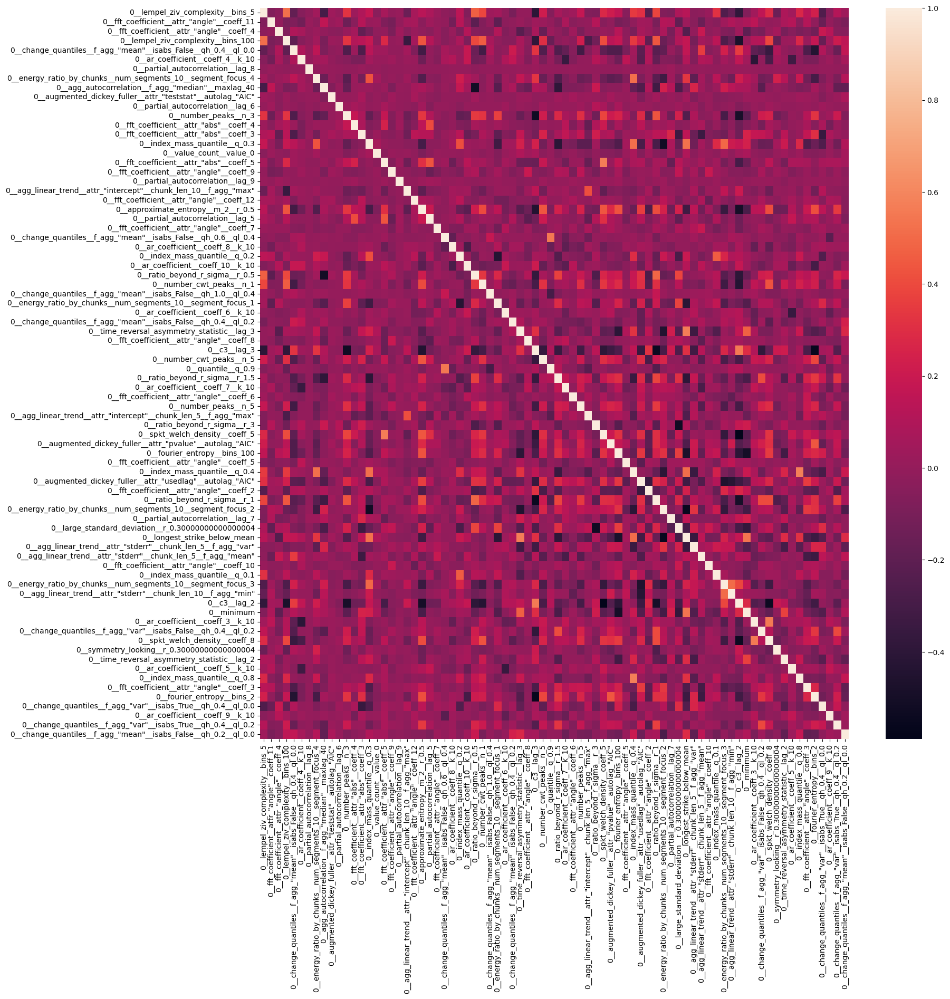

In [326]:
better_features_cm =better_features_df.corr()
plt.figure(figsize=(18,18))
sns.heatmap(better_features_cm)

In [335]:
better_features_dict = settings.from_columns(better_features_df)["0"]
better_features_dict_fp = CLOSED_WORLD_PROCESSED_DATA_FOLDER+"LR/better_features.json"
with open(better_features_dict_fp, "w") as f:
    json.dump(better_features_dict, f)


#### PCA

In [537]:
# Yields really bad scores

In [519]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd


# Standardizing the features
x = StandardScaler().fit_transform(features)

# Apply PCA
pca = PCA()
principalComponents = pca.fit_transform(x, features.y)


<Axes: xlabel='0', ylabel='1'>

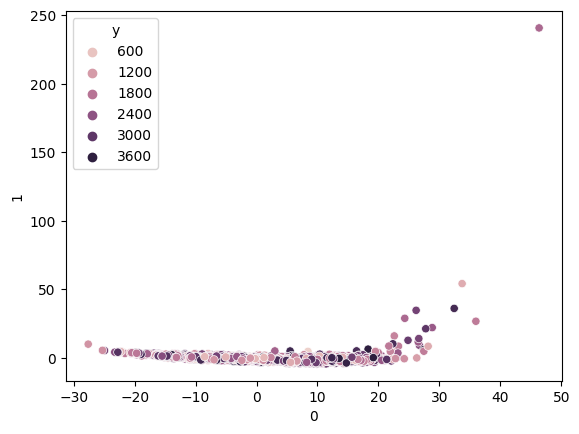

In [518]:
pc = pd.DataFrame(principalComponents, columns=[i for i in range(principalComponents.shape[1])])
pc["y"] = features.y

sns.scatterplot(data=pc, x=0, y=1, hue="y")

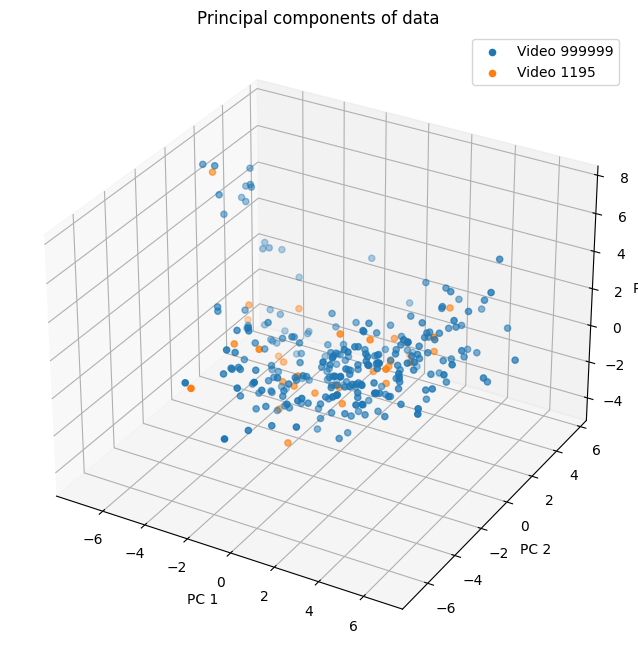

In [507]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # Import the 3D plotting module

#plt.switch_backend(matplotlib.backends.)

# Example DataFrame with three columns for three classes
classes = pc["y"].unique()
classes = [999999] + list(np.random.choice(classes,1))
class_dfs = [ ]
for c in classes[:5]:
    df = pc[pc["y"] == c]
    class_dfs.append(df)

# Create a 3D scatter plot
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111, projection='3d')

for i in range(len(class_dfs)):
    ax.scatter(class_dfs[i][0], class_dfs[i][1], class_dfs[i][2], label='Video '+str(classes[i]))

# Set labels and title
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
ax.set_zlabel('PC 3')
ax.set_title('Principal components of data')

# Set view angles based on widget values
# ax.view_init(elev=elevation, azim=azimuth)

# Show the legend
ax.legend()

# Show the plot
plt.show()

# # Create interactive widgets for elevation and azimuth angles
# elevation_widget = widgets.FloatSlider(min=-90, max=90, value=30, step=5, description='Elevation')
# azimuth_widget = widgets.FloatSlider(min=-180, max=180, value=30, step=5, description='Azimuth')

# # Create a button to update the plot with the current widget values
# button = widgets.Button(description='Update Plot')

# # Function to update the plot based on the widget values
# def update_plot(_):
#     create_3d_scatter_plot(elevation_widget.value, azimuth_widget.value)
#     plt.show()

# button.on_click(update_plot)

# # Display the widgets and button
# display(elevation_widget, azimuth_widget, button)

# # Initialize the plot
# create_3d_scatter_plot(elevation_widget.value, azimuth_widget.value)


## Inspecting Linearity

In [105]:
# Define the number of classes in your dataset
negative_class = 9999

df_const  = better_features_df
df_const["y"] = features.y
classes = [x for x in df_const["y"].unique() if x != negative_class]

y = df_const["y"]
X = df_const.drop("y", axis=1)
scaler = StandardScaler().fit(X)
X_scaled= scaler.transform(X)


feat_list = list(X.columns)

feature_logits = {c:{f : {"values":[],
                 "probas":[]} for f in list(df_const.columns)}for c in classes}

# Initialize a list to store the fitted models
models = []

# Fit a logistic regression model for each class
for c in classes:
    # Create a binary target variable for the current class
    y_binary = (y == c).astype(int)    

    # Fit a logistic regression model
    model = LogisticRegression()
    model.fit(X_scaled, y_binary)

    # Get the predicted probabilities
    probs = model.predict_proba(X)[:, 0]

    for i in range(len(feat_list)):
        feature_logits[c][feat_list[i]]["values"] = X_scaled[:,i]
        feature_logits[c][feat_list[i]]["probas"] = probs

/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(
/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(
/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(
/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(
/home/de

In [106]:
result = {fn: {
            "values":[],
            "probas":[],
            "class":[]       
            } for fn in better_features_df.columns
}

for c,v in feature_logits.items():
    for fn in v.keys():
        result[fn]["values"].extend(v[fn]["values"]),
        result[fn]["probas"].extend(v[fn]["probas"]),
        result[fn]["class"].extend( [c]*len(v[fn]["probas"]) )

# del result["const"]
# del result["y"]


r = pd.DataFrame(result).T
r2 = r.reset_index()
plot_values = r2.explode(["values",	"probas",	"class"])

/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/deborahdarragh/Documents/G

KeyboardInterrupt: 

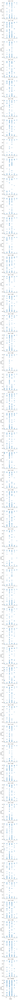

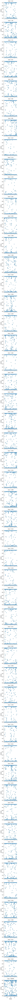

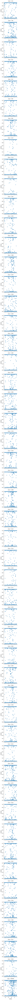

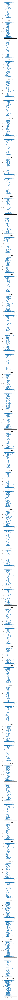

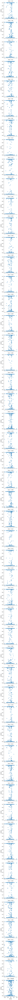

Error in callback <function flush_figures at 0x7f41e34e1a20> (for post_execute):


KeyboardInterrupt: 

In [112]:
img_folder = "../../Images/Feature_linearery/"

for feature in X.columns:
    p_data = plot_values[plot_values["index"] == feature]
    # ax =sns.scatterplot(data=p_data, x="values", y = "probas", hue="class", legend=False)
    # ax.set_title(feature)

    g = sns.FacetGrid(p_data, row="class")
    g.map(sns.scatterplot, "values", "probas", alpha=.7)
    # g.add_legend()

    # Create a scatter plot of the probabilities against the first input variable
    # plt.scatter(f_vals, probas)
    # plt.xlabel(feature)
    # plt.ylabel('Predicted probability')
    # plt.title(class_n)
    plt.savefig(img_folder + feature+".png")

In [1]:
import sys
sys.path.insert(0, '../../')

from modelling_utilities.constants import *
from modelling_utilities import data_processing


import warnings
import pandas as pd
import joblib

from statsmodels.stats.outliers_influence import variance_inflation_factor 
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score as AUC, accuracy_score as accuracy, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report

from tsfresh.utilities.dataframe_functions import impute

from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import RepeatedStratifiedKFold, cross_val_score, cross_validate, cross_val_predict

from IPython.display import clear_output

import os
import json
import re


from tsfresh.feature_extraction import ComprehensiveFCParameters
from tsfresh.feature_extraction import settings

from datetime import datetime
from tsfresh import extract_features, select_features 
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt



### Data

In [2]:
train_data = OPEN_WORLD_PROCESSED_DATA_FOLDER + "Train/Pre_Processed_Bin_Aggregates/data-1000-ms-aggregate.parquet"
test_data = OPEN_WORLD_PROCESSED_DATA_FOLDER + "Test/Pre_Processed_Bin_Aggregates/data-1000-ms-aggregate.parquet"
train_data_log = OPEN_WORLD_PROCESSED_DATA_FOLDER + "Train/Pre_Processed_Bin_Aggregates-log-scaled/data-1000-ms-aggregate-log-scaled.parquet"
test_data_log = OPEN_WORLD_PROCESSED_DATA_FOLDER + "Test/Pre_Processed_Bin_Aggregates-log-scaled/data-1000-ms-aggregate-log-scaled.parquet"

filename = META_DATA_FOLDER+"all_ids_dict.json"

with open(filename, "r") as json_file:
    pseudonym_video_id_map = json.load(json_file)

pseudonym_video_id_map = { v:int(k) for k,v in pseudonym_video_id_map.items()}
pseudonym_video_id_map["unknown"] = 999999
datasets = {
    "train":train_data,
    "test":test_data,
    "train_log": train_data_log,
    "test_log": test_data_log
}

for name, fp in datasets.items():
    dataset = data_processing.read_parquet_to_pandas(fp)
    dataset.reset_index(inplace=True, drop=True)
    dataset["video_id"] = dataset["video_id"].map(pseudonym_video_id_map)
    dataset["class"] = dataset["class"].map(pseudonym_video_id_map)
    dataset["class"] = dataset["class"]
    print(name)
    display(pd.concat([dataset.head(1), dataset.tail(1)]))
    datasets[name] = dataset


train


,ts,bpts,video_id,cw,class,ts_i,bpi,ts_f,bpi_sparse,df,df_sparse,mpdf,mpdf_sparse,sdf,sdf_sparse,ndf,ndf_sparse,adf,adf_sparse
0,"[2023-06-21T20:19:08.310000, 2023-06-21T20:19:...","[5863.0, 5863.0, 5949.0, 72940.0, 22823.0, 268...",3396,1,3396,"[2023-06-21T20:19:08.310000, 2023-06-21T20:19:...","[113438.0, 2961452.0, 20086.0, 3986507.0, 1790...","[2023-06-21T20:19:08.310000, 2023-06-21T20:19:...","[113438.0, 2961452.0, 20086.0, 0.0, 0.0, 0.0, ...","[25.106348842539536, -0.9932175162724232, 197....","[25.106348842539536, -0.9932175162724232, 197....","[0.961695141437376, -0.9932175162724232, 0.994...","[0.961695141437376, -0.9932175162724232, 0.994...","[2848014.0, -2941366.0, 3966421.0, -3984717.0,...","[2848014.0, -2941366.0, 3966421.0, 0.0, 0.0, 0...","[0.926216547583816, -0.9865264169029541, 0.989...","[0.926216547583816, -0.9865264169029541, 0.989...","[2848014.0, 2941366.0, 3966421.0, 3984717.0, 9...","[2848014.0, 2941366.0, 3966421.0, 0.0, 0.0, 0...."
2661,"[2023-06-27T14:26:48.420000, 2023-06-27T14:26:...","[5529.0, 61407.0, 4982.0, 6390.0, 701.0, 5862....",2466,0,999999,"[2023-06-27T14:26:48.420000, 2023-06-27T14:26:...","[5529.0, 61407.0, 11372.0, 96543.0, 23916.0, 4...","[2023-06-27T14:26:48.420000, 2023-06-27T14:26:...","[5529.0, 61407.0, 0.0, 0.0, 0.0, 11372.0, 0.0,...","[10.106348345089527, -0.8148093865520217, 7.48...","[10.106348345089527, -0.8148093865520217, 0.0,...","[0.9099614050515413, -0.8148093865520217, 0.88...","[0.9099614050515413, -0.8148093865520217, 0.0,...","[55878.0, -50035.0, 85171.0, -72627.0, 4102609...","[55878.0, -50035.0, 0.0, 0.0, 0.0, 85171.0, 0....","[0.8347974184295447, -0.6874922711221644, 0.78...","[0.8347974184295447, -0.6874922711221644, 0.0,...","[55878.0, 50035.0, 85171.0, 72627.0, 4102609.0...","[55878.0, 50035.0, 0.0, 0.0, 0.0, 85171.0, 0.0..."


test


,ts,bpts,video_id,cw,class,ts_i,bpi,ts_f,bpi_sparse,df,df_sparse,mpdf,mpdf_sparse,sdf,sdf_sparse,ndf,ndf_sparse,adf,adf_sparse
0,"[2023-06-21T21:28:23.770000, 2023-06-21T21:28:...","[0.0, 5863.0, 5863.0, 72787.0, 5672.0, 35037.0...",2861,1,2861,"[2023-06-21T21:28:34.090000, 2023-06-21T21:28:...","[90185.0, 205811.0, 2926755.0, 3946677.0, 1218...","[2023-06-21T21:28:34.090000, 2023-06-21T21:28:...","[90185.0, 0.0, 205811.0, 2926755.0, 0.0, 0.0, ...","[1.282097909851971, 13.220595594987634, 0.3484...","[1.282097909851971, 0.0, 13.220595594987634, 0...","[0.5618067061527323, 0.9296794572828952, 0.258...","[0.5618067061527323, 0.0, 0.9296794572828952, ...","[115626.0, 2720944.0, 1019922.0, -3934494.0, -...","[115626.0, 0.0, 2720944.0, 1019922.0, 0.0, 0.0...","[0.39063365721158394, 0.8685990973534157, 0.14...","[0.39063365721158394, 0.0, 0.8685990973534157,...","[115626.0, 2720944.0, 1019922.0, 3934494.0, 10...","[115626.0, 0.0, 2720944.0, 1019922.0, 0.0, 0.0..."
3499,"[2023-06-22T17:30:33.070000, 2023-06-22T17:30:...","[61146.0, 436491.0, 4856.0, 6390.0, 737.0, 996...",3007,0,999999,"[2023-06-22T17:30:33.070000, 2023-06-22T17:30:...","[61146.0, 436491.0, 11246.0, 10705.0, 1131480....","[2023-06-22T17:30:33.070000, 2023-06-22T17:30:...","[61146.0, 0.0, 0.0, 436491.0, 0.0, 0.0, 11246....","[6.138504562849573, -0.9742354366985803, -0.04...","[6.138504562849573, 0.0, 0.0, -0.9742354366985...","[0.8599146374152045, -0.9742354366985803, -0.0...","[0.8599146374152045, 0.0, 0.0, -0.974235436698...","[375345.0, -425245.0, -541.0, 1120775.0, -9572...","[375345.0, 0.0, 0.0, -425245.0, 0.0, 0.0, -541...","[0.7542546072739769, -0.9497651523103965, -0.0...","[0.7542546072739769, 0.0, 0.0, -0.949765152310...","[375345.0, 425245.0, 541.0, 1120775.0, 957277....","[375345.0, 0.0, 0.0, 425245.0, 0.0, 0.0, 541.0..."


train_log


,ts,bpts,video_id,cw,class,ts_i,bpi,ts_f,bpi_sparse,df,df_sparse,mpdf,mpdf_sparse,sdf,sdf_sparse,ndf,ndf_sparse,adf,adf_sparse
0,"[2023-06-21T20:19:08.310000, 2023-06-21T20:19:...","[5863.0, 5863.0, 5949.0, 72940.0, 22823.0, 268...",3396,1,3396,"[2023-06-21T20:19:08.310000, 2023-06-21T20:19:...","[11.639011711145091, 14.901190246565104, 9.907...","[2023-06-21T20:19:08.310000, 2023-06-21T20:19:...","[11.639011711145091, 14.901190246565104, 9.907...","[0.2802796849406269, -0.33510154759368016, 0.5...","[0.2802796849406269, -0.33510154759368016, 0.5...","[0.21892066884871714, -0.33510154759368016, 0....","[0.21892066884871714, -0.33510154759368016, 0....","[3.262178535420013, -4.993411912611819, 5.2906...","[3.262178535420013, -4.993411912611819, 5.2906...","[0.12291460858579929, -0.20127446638523175, 0....","[0.12291460858579929, -0.20127446638523175, 0....","[3.262178535420013, 4.993411912611819, 5.29064...","[3.262178535420013, 4.993411912611819, 5.29064..."
2661,"[2023-06-27T14:26:48.420000, 2023-06-27T14:26:...","[5529.0, 61407.0, 4982.0, 6390.0, 701.0, 5862....",2466,0,999999,"[2023-06-27T14:26:48.420000, 2023-06-27T14:26:...","[8.617762246337932, 11.025279114151642, 9.3389...","[2023-06-27T14:26:48.420000, 2023-06-27T14:26:...","[8.617762246337932, 11.025279114151642, 0.0, 0...","[0.2793668238917557, -0.15295482535369015, 0.2...","[0.2793668238917557, -0.15295482535369015, 0.0...","[0.21836334870865173, -0.15295482535369015, 0....","[0.21836334870865173, -0.15295482535369015, 0....","[2.40751686781371, -1.686369641380752, 2.13883...","[2.40751686781371, -1.686369641380752, 0.0, 0....","[0.1225633456464761, -0.0828105492238323, 0.10...","[0.1225633456464761, -0.0828105492238323, 0.0,...","[2.40751686781371, 1.686369641380752, 2.138834...","[2.40751686781371, 1.686369641380752, 0.0, 0.0..."


test_log


,ts,bpts,video_id,cw,class,ts_i,bpi,ts_f,bpi_sparse,df,df_sparse,mpdf,mpdf_sparse,sdf,sdf_sparse,ndf,ndf_sparse,adf,adf_sparse
0,"[2023-06-21T21:28:23.770000, 2023-06-21T21:28:...","[0.0, 5863.0, 5863.0, 72787.0, 5672.0, 35037.0...",2861,1,2861,"[2023-06-21T21:28:34.090000, 2023-06-21T21:28:...","[11.4096183951043, 12.234713550905097, 14.8894...","[2023-06-21T21:28:34.090000, 2023-06-21T21:28:...","[11.4096183951043, 0.0, 12.234713550905097, 14...","[0.072315753886636, 0.216980258407323, 0.02008...","[0.072315753886636, 0.0, 0.216980258407323, 0....","[0.06743886175739346, 0.17829398374242136, 0.0...","[0.06743886175739346, 0.0, 0.17829398374242136...","[0.8250951558007973, 2.6546913078149643, 0.298...","[0.8250951558007973, 0.0, 2.6546913078149643, ...","[0.03489610777267293, 0.09787198491483251, 0.0...","[0.03489610777267293, 0.0, 0.09787198491483251...","[0.8250951558007973, 2.6546913078149643, 0.298...","[0.8250951558007973, 0.0, 2.6546913078149643, ..."
3499,"[2023-06-22T17:30:33.070000, 2023-06-22T17:30:...","[61146.0, 436491.0, 4856.0, 6390.0, 737.0, 996...",3007,0,999999,"[2023-06-22T17:30:33.070000, 2023-06-22T17:30:...","[11.021019726056748, 12.986523035492528, 9.327...","[2023-06-22T17:30:33.070000, 2023-06-22T17:30:...","[11.021019726056748, 0.0, 0.0, 12.986523035492...","[0.17834132941335593, -0.2817347827929693, -0....","[0.17834132941335593, 0.0, 0.0, -0.28173478279...","[0.15134946467688118, -0.2817347827929693, -0....","[0.15134946467688118, 0.0, 0.0, -0.28173478279...","[1.96550330943578, -3.6587552466403803, -0.049...","[1.96550330943578, 0.0, 0.0, -3.65875524664038...","[0.0818702409054437, -0.1639646662061388, -0.0...","[0.0818702409054437, 0.0, 0.0, -0.163964666206...","[1.96550330943578, 3.6587552466403803, 0.04930...","[1.96550330943578, 0.0, 0.0, 3.658755246640380..."


### Logistic Regression Class and Functions for Modelling

Class and Functions to facilitate structured modelling, hyperparameter tuning in a strructured manner

In [3]:


class LogisticRegressionModeller():
    def __init__(self, 
                 data:pd.DataFrame = None,
                 features_file:str = None, 
                 train_file:str = None, 
                 test_file:str = None, 
                 feature_of_interest:str = None,
                 model_dir:str = None,
                 evaluation_folder:str = None,
                 data_ow_test:pd.DataFrame=None,
                 validation_proportion:float=0.2, 
                 fdr_level:float = 0.05):
        
        self.features_file = features_file
        self.train_file = train_file
        self.test_file = test_file
        if(isinstance(data_ow_test, pd.DataFrame) ):
            self.ow_test_file = str.replace(test_file, ".csv", "-ow.csv")
            self.ow=True
        else: 
            self.ow_test_file = None
            self.ow=False

        self.fdr_level = fdr_level
        self.data = data
        self.data_ow_test=data_ow_test
        self.data_transformed = None
        self.data_ow_test_transformed=None
        self.validation_proportion = validation_proportion
        self.validation_split_i = int(len(data)*validation_proportion)
        self.feature_of_interest = feature_of_interest
        self.model_dir = model_dir
        self.model = None
        self.model_fitted = None
        self.evaluation_folder = evaluation_folder
        self.features_dict=None
        self.features_list=None
    
    def _transform_any_data(self, vids_to_nums_map, data_in, feature_name=None):
        data = data_in 
        feature_of_interest = feature_name if isinstance(feature_name, str) else self.feature_of_interest
        
        cn = [self.feature_of_interest, "class"]
        data = data[cn]
        vids_to_nums_map["unknown"] = str(9999)
        data["class"] = data["class"].map(vids_to_nums_map)
        output_length = max(data[feature_of_interest].map(len))
        data[feature_of_interest]= data[feature_of_interest].apply(lambda array: data_processing.extend_list_with_fill_value(list(array), max_length=output_length, filling_value=1)) 

        #shuffle
        data = data.sample(len(data))
        data.reset_index(inplace=True, drop=True)

        data["id"] = data.index
        data.rename({"class": "target", self.feature_of_interest:0}, axis=1, inplace=True)

        y = data["target"]
        data.drop("target", axis = 1, inplace = True )

        # Explode the 'measurements' column
        exploded_df = data.explode(0)

        # Add the 'time' column
        exploded_df['time'] = exploded_df.groupby('id').cumcount()

        # Reset the index
        exploded_df.reset_index(drop=True, inplace=True)

        # Reorder the columns
        data = exploded_df[['id', 'time', 0]]
        data[0] = data[0].map(float)        
        return(data, y)

    def transform_data(self, vids_to_nums_map, data_in=None)-> None:
        data = data_in if isinstance(data_in, pd.DataFrame) else self.data
        transformed_data, target = self._transform_any_data(vids_to_nums_map=vids_to_nums_map, data_in=data)
        return (transformed_data, target )


    def extract_features_from_df(self, target, data, features_dict=None, ):
        start_time = datetime.now()
        
        features_fn =  self.features_file

        with warnings.catch_warnings():
            warnings.simplefilter( "ignore" )
            if(features_dict):
                f = extract_features( data, column_id = "id", column_sort = "time", default_fc_parameters = features_dict)
            else:
                f = extract_features( data, column_id = "id", column_sort = "time")

        impute( f )
        assert f.isnull().sum().sum() == 0
        f['y'] = target
        f = f.sample(len(f))

        if(features_dict is None):
            f.to_csv( features_file, index = None )

        end_time = datetime.now()
        exicution_time = end_time  - start_time
        m = int(exicution_time.seconds / 60)
        s = exicution_time.seconds % 60
        print(f"Features extracted and saved to: ", features_fn)
        print(f"Duration: {m}:{s}")

        return f

    #NOTE: can I give a name to the return variable as well?
     
    def train_test_split_from_features(self, features:pd.DataFrame, save_to_disk=False) ->tuple[ pd.DataFrame, pd.DataFrame]:
        start_time = datetime.now()

        validation_split_i = int(len(features)*(1-self.validation_proportion))
        
        features_ow = features[features["y"] == "unknown"]
        features = features[features["y"] != "unknown"]

        # Shuffle 
        train = features.iloc[:validation_split_i]
        train = train.sample(len(train))
        test = pd.concat([features.iloc[validation_split_i:], features_ow])
        test = test.sample(len(test))

        if(save_to_disk):
            print("saving {}".format( self.train_file ))
            train.to_csv( self.train_file, index = None )

            print("saving {}".format( self.test_file ))
            test.to_csv( self.test_file, index = None )

        end_time = datetime.now()
        exicution_time = end_time  - start_time
        m = int(exicution_time.seconds / 60)
        s = exicution_time.seconds % 60

        print(f"Duration: {m}:{s}")
        return train, test


    #NOTE: this function does not follow the single purpose principal. 
    def select_features_from_file(self)-> None:
        start_time = datetime.now()

        print("loading {}".format( self.features_file ))
        features = pd.read_csv( self.features_file )
        display(features.head(5))

        validation_split_i = int(len(features)*(1-self.validation_proportion))
        
        features_ow = features[features["y"] == "unknown"]
        features = features[features["y"] != "unknown"]

        # Shuffle
        train = features.iloc[:validation_split_i]
        train = train.sample(len(train))
        test = pd.concat([features.iloc[validation_split_i:], features_ow])
        test = test.sample(len(test))

        train_x = train.drop( 'y', axis = 1 )
        test_x = test.drop( 'y', axis = 1 )

        train_y = train.y
        test_y = test.y

        print("selecting features...")
        train_features_selected = select_features( train_x, train_y, fdr_level = self.fdr_level )

        print("selected {} features.".format( len( train_features_selected.columns )))

        train = train_features_selected.copy()
        train['y'] = train_y

        test = test_x[ train_features_selected.columns ].copy()
        test['y'] = test_y

        self.features_list = list(train_features_selected.columns)

        print("saving {}".format( self.train_file ))
        train.to_csv( self.train_file, index = None )

        print("saving {}".format( self.test_file ))
        test.to_csv( self.test_file, index = None )

        features_dict = settings.from_columns(train_x)["0"]
        self.features_dict = features_dict

        if(self.ow):
            data_trans, target = self.transform_data(data_in=self.data_ow_test, vids_to_nums_map=vids_to_nums_map)
            test_ow = self.extract_features_from_df(data=data_trans, target=target, features_dict=features_dict )
            y = test_ow.y
            test_ow = test_ow[ train_features_selected.columns ].copy()
            test_ow["y"] = y
            print("saving {}".format( self.ow_test_file ))
            test_ow.to_csv( self.ow_test_file, index = None )
            

        end_time = datetime.now()
        exicution_time = end_time  - start_time
        m = int(exicution_time.seconds / 60)
        s = exicution_time.seconds % 60

        print(f"Duration: {m}:{s}")

        

        return features_dict

    def key_encoder(obj):
        """
        Custom JSON encoder function to convert numeric keys represented as strings to actual numbers.
        """
        if isinstance(obj, str):
            if obj.isnumeric():
                return int(obj)
        return obj
    
    def train(self, onevsrest=False, cross_val=False, train_df=None):
        start_time = datetime.now()
        train = train_df if isinstance(train_df, pd.DataFrame) else pd.read_csv( self.train_file )

        x_train = train.drop( 'y', axis = 1 ).values
        y_train = train.y.values

        if(onevsrest):
            model = OneVsRestClassifier(LogisticRegression())
        else:
            model = LogisticRegression(multi_class='multinomial', solver='lbfgs',  max_iter=2000)
        print("Model created.")

        # define the model evaluation procedure
        scoring = ['precision_macro', 'recall_macro', 'accuracy', 'f1_macro']
        cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

        scaler = StandardScaler().fit(x_train)
        x_train_scaled = scaler.transform(x_train)

        #train_fn = re.search(r"/Train/(.*)", self.train_file).group(1)

        if(cross_val):
            print("Begin validation")
            # evaluate the model and collect the scores
            train_scores = cross_validate(model, x_train_scaled, y_train, scoring=scoring, cv=cv, n_jobs=-1)
            train_scores_dict = {str.replace(k, "test_", ""):{
            "mean": np.mean(train_scores[k]),
            "std": np.std(train_scores[k])
            }
                for k in train_scores.keys()
            }
            evaluation_train_fn = self.evaluation_folder+str(start_time.timestamp)+train_fn[:-10]+"-eval-train.json"
            with open(evaluation_train_fn, "w") as f: 
                json.dump(train_scores_dict, f, indent=4, sort_keys=True, default=self.key_encoder)
            print("Validation complete")

        self.model = model

        print("Fitting model")
        results = model.fit(x_train_scaled, y_train)
        self.model_fitted = model
        print("Fitting complete")
        model_fn = self.model_dir+str(start_time.timestamp)+train_fn[:-10]+"-lr-model.joblib"
        joblib.dump(model, model_fn)
        print("Model saved as: ", model_fn)
     
        end_time = datetime.now()
        exicution_time = end_time  - start_time
        m = int(exicution_time.seconds / 60)
        s = exicution_time.seconds % 60
        print(f"Training completed in: {m}:{s}")
        return ( model, pd.DataFrame(train_scores_dict)) if(cross_val) else (model, results)

    def evaluate(self, model, vids_to_nums_map, ow=False): 
        if(ow):
            test_fp = self.ow_test_file
            test = pd.read_csv( test_fp )
            
        else:
            test_fp = self.test_file
            test = pd.read_csv( test_fp )

        x_test = test.drop( 'y', axis = 1 ).values
        y_test = test.y.values
        
        scaler = StandardScaler().fit(x_test)
        x_test_scaled = scaler.transform(x_test)
        predictions = model.predict(x_test_scaled)
        report = classification_report(y_test, predictions, output_dict=True)
        accuracy = accuracy_score(y_test, predictions)
        report["weighted avg"]["accuracy"] = accuracy
        v_ids = list(set(vids_to_nums_map.values()) and set(y_test))
        cm = confusion_matrix(y_test, predictions, labels = v_ids )
        cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        report["cm"] = cm_normalized.tolist()
        test_fn = re.search(r"/Test/(.*)", test_fp).group(1)
        evaluation_test_fn = self.evaluation_folder+test_fn[:-9]+"-eval-test.json"
        with open(evaluation_test_fn, "w") as f: 
            json.dump(report, f, indent=4, sort_keys=True, default=self.key_encoder)
        del report["cm"]
        return pd.DataFrame(report).T

In [4]:
"""
Sources: 
- https://machinelearningmastery.com/one-vs-rest-and-one-vs-one-for-multi-class-classification/
- https://towardsdatascience.com/assumptions-of-logistic-regression-clearly-explained-44d85a22b290
- https://github.com/blue-yonder/tsfresh/blob/main/notebooks
"""

class LogisticRegressionModeller():
    def __init__(self, 
                video_id_map:dict,
                data:pd.DataFrame = None,
                features_file:str = None, 
                train_file:str = None, 
                test_file:str = None, 
                feature_of_interest:str = None,
                model_dir:str = None,
                evaluation_folder:str = None,
                data_ow_test:pd.DataFrame=None,
                validation_proportion:float=0.2, 
                fdr_level:float = 0.05):

                self.video_id_map = video_id_map
    def transform_data(self, data_frame: pd.DataFrame, feature_name:str)-> pd.DataFrame:
        """
        Function to transform dta into the TS fresh library needed format of columns [id, 0]
        @param: data_frame: data input to transform, contains column: "class" with class names
        @param: feature_name: the name of the fingerprinting feature that should be used for data transformation
        @return: transformed data frame with columns: [id, 0]
        """
        data = data_frame.copy()
        columns = [feature_name, "class"]
        data = data_frame[columns]
        output_length = max(data[feature_name].map(len))
        data[feature_name]= data[feature_name].apply(lambda array: data_processing.extend_list_with_fill_value(list(array), max_length=output_length, filling_value=1)) 
        #shuffle
        data = data.sample(len(data))
        data.reset_index(inplace=True, drop=True)
        data["id"] = data.index
        data.rename({"class": "target", feature_name:0}, axis=1, inplace=True)
        y = data["target"]
        data.drop("target", axis = 1, inplace = True )
        # Explode the 'measurements' column
        exploded_df = data.explode(0)

        exploded_df['time'] = exploded_df.groupby('id').cumcount()
        exploded_df.reset_index(drop=True, inplace=True)

        # Reorder the columns
        data = exploded_df[['id', 'time', 0]]
        data[0] = data[0].map(float)     

        return(data, y)
    
    def train_test_split(self, train_frame:pd.DataFrame, test_frame:pd.DataFrame, test_prop:float=0.2, ow:bool=False, ow_count:int=300, seed:int=42)->tuple[pd.DataFrame, pd.DataFrame]:
        """Split data into train and test set. 
        @param train_frame: train data
        @paran test_frame: test data
        @param cw:  closed world. trainingset only contains closed_world traces
        @param test_prop: percentage of traces that should be considered for the test set
        @param ow_count: number of traces to be considered in the open_world training set 
        """
        np.random.seed(seed)

        unknown_id = self.video_id_map["unknown"]        
        
        cw_train_data = train_frame[train_frame["class"]!=unknown_id]
        
        if(ow==True):
            ow_train_data = train_frame[train_frame["class"]==unknown_id]
            ow_sample = ow_train_data.sample(ow_count)
            train = pd.concat([cw_train_data, ow_sample])
            train = train.sample(len(train))
            return train, test_frame
        else:
            cw_test_data = test_frame[test_frame["class"]!=unknown_id]
            return cw_train_data, cw_test_data
        
    def extract_features_from_df(self, data_frame:pd.DataFrame, target:pd.DataFrame, features_dict=None, file_path:str=None) -> pd.DataFrame:
        """Extract time series featrues from dataframe. 
        @param data_frame: given dataframe to extract features from. In required format columns = ["id", 0]
        @param target: y_variable
        @param features_dict: if a defined set of features is known, provide a dictionary of features
        @param file_path: path to save features file to
        @return: features data frame
        """
        start_time = datetime.now()
        
        with warnings.catch_warnings():
            warnings.simplefilter( "ignore" )
            if(type(features_dict))==dict:
                f = extract_features( data_frame, column_id = "id", column_sort = "time", default_fc_parameters = features_dict)
            else:
                f = extract_features( data_frame, column_id = "id", column_sort = "time")
            print("Features extracted")
        impute( f )
        assert f.isnull().sum().sum() == 0
        f['y'] = target
        f = f.sample(len(f))



        if(type(file_path) == str):
            f.to_csv( file_path, index = None )
            print(f"Features saved to: ", file_path)


        end_time = datetime.now()
        exicution_time = end_time  - start_time
        m = int(exicution_time.seconds / 60)
        s = exicution_time.seconds % 60
        print(f"Duration: {m}:{s}")

        return f
    
    def select_features_from_df(self, features_frame:pd.DataFrame, fdr_level:float= 0.05)-> tuple[pd.DataFrame, dict]:
        """
        Use TS fresh automatic feature selection to extract relevant features for model
        @param features_frame: features dataframe
        @return: tuple of dataframe and dictionary describing selected features
        
        
        """
        start_time = datetime.now()
        features = features_frame.drop( "y", axis = 1 )
        y = features_frame["y"]

        print("selecting features...")
        features_selected = select_features( features, y, fdr_level = fdr_level )
        print("selected {} features.".format( len( features_selected.columns )))

        # print("saving {}".format( self.train_file ))
        # train.to_csv( self.train_file, index = None )

        features_dict = settings.from_columns(features)["0"]

        end_time = datetime.now()
        exicution_time = end_time  - start_time
        m = int(exicution_time.seconds / 60)
        s = exicution_time.seconds % 60
        print(f"Duration: {m}:{s}")

        return features_selected, features_dict


### Create a Baseline Model

- Create a baseline One-vs-rest logistic regression model for the open and closed world with a decision threshold to identify the negative class
- Use 1000ms binned dataset according to data analysis results
- Use SDF and MPDF fingerprints according to data analysis results




#### Data Transformation
The data requires a specific format for the TS fresh library. This step performs the required data transformations. 

In [5]:
log_reg_modeller = LogisticRegressionModeller(video_id_map=pseudonym_video_id_map)

train, test = log_reg_modeller.train_test_split(train_frame=datasets["train"], test_frame=datasets["test"])

train_trans, train_target = log_reg_modeller.transform_data(train, "mpdf")

features = log_reg_modeller.extract_features_from_df(train_trans, train_target)

selected_features, features_dict = log_reg_modeller.select_features_from_df(features)


/tmp/ipykernel_61204/1372174324.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[feature_name]= data[feature_name].apply(lambda array: data_processing.extend_list_with_fill_value(list(array), max_length=output_length, filling_value=1))
Feature Extraction: 100%|████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:22<00:00,  1.47s/it]


Features extracted


/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning: The columns ['0__fft_coefficient__attr_"real"__coeff_14'
 '0__fft_coefficient__attr_"real"__coeff_15'
 '0__fft_coefficient__attr_"real"__coeff_16'
 '0__fft_coefficient__attr_"real"__coeff_17'
 '0__fft_coefficient__attr_"real"__coeff_18'
 '0__fft_coefficient__attr_"real"__coeff_19'
 '0__fft_coefficient__attr_"real"__coeff_20'
 '0__fft_coefficient__attr_"real"__coeff_21'
 '0__fft_coefficient__attr_"real"__coeff_22'
 '0__fft_coefficient__attr_"real"__coeff_23'
 '0__fft_coefficient__attr_"real"__coeff_24'
 '0__fft_coefficient__attr_"real"__coeff_25'
 '0__fft_coefficient__attr_"real"__coeff_26'
 '0__fft_coefficient__attr_"real"__coeff_27'
 '0__fft_coefficient__attr_"real"__coeff_28'
 '0__fft_coefficient__attr_"real"__coeff_29'
 '0__fft_coefficient__attr_"real"__coeff_30'
 '0__fft_coefficient__attr_"real"__coeff_

Duration: 0:23
selecting features...
selected 355 features.
Duration: 0:16


In [6]:
def show_start_and_end_of_df(df: pd.DataFrame, n:int=1)-> None:
    """
    print head and tail of df
    @param df: dataframe
    @param n: nrows
    """
    display(pd.concat([df.head(n), df.tail(n)]))

In [7]:
print(len(train))
show_start_and_end_of_df(train)

print(len(test))
show_start_and_end_of_df(test)


2000


,ts,bpts,video_id,cw,class,ts_i,bpi,ts_f,bpi_sparse,df,df_sparse,mpdf,mpdf_sparse,sdf,sdf_sparse,ndf,ndf_sparse,adf,adf_sparse
0,"[2023-06-21T20:19:08.310000, 2023-06-21T20:19:...","[5863.0, 5863.0, 5949.0, 72940.0, 22823.0, 268...",3396,1,3396,"[2023-06-21T20:19:08.310000, 2023-06-21T20:19:...","[113438.0, 2961452.0, 20086.0, 3986507.0, 1790...","[2023-06-21T20:19:08.310000, 2023-06-21T20:19:...","[113438.0, 2961452.0, 20086.0, 0.0, 0.0, 0.0, ...","[25.106348842539536, -0.9932175162724232, 197....","[25.106348842539536, -0.9932175162724232, 197....","[0.961695141437376, -0.9932175162724232, 0.994...","[0.961695141437376, -0.9932175162724232, 0.994...","[2848014.0, -2941366.0, 3966421.0, -3984717.0,...","[2848014.0, -2941366.0, 3966421.0, 0.0, 0.0, 0...","[0.926216547583816, -0.9865264169029541, 0.989...","[0.926216547583816, -0.9865264169029541, 0.989...","[2848014.0, 2941366.0, 3966421.0, 3984717.0, 9...","[2848014.0, 2941366.0, 3966421.0, 0.0, 0.0, 0...."
1999,"[2023-06-26T13:50:48.250000, 2023-06-26T13:50:...","[0.0, 73382.0, 5599.0, 34081.0, 126024.0, 2682...",912,1,912,"[2023-06-26T13:50:58.800000, 2023-06-26T13:51:...","[78981.0, 195401.0, 19862.0, 2896042.0, 227924...","[2023-06-26T13:50:58.800000, 2023-06-26T13:51:...","[78981.0, 195401.0, 19862.0, 0.0, 0.0, 0.0, 0....","[1.4740253985135665, -0.8983526184615227, 144....","[1.4740253985135665, -0.8983526184615227, 144....","[0.5958004309087467, -0.8983526184615227, 0.99...","[0.5958004309087467, -0.8983526184615227, 0.99...","[116420.0, -175539.0, 2876180.0, -616802.0, -2...","[116420.0, -175539.0, 2876180.0, 0.0, 0.0, 0.0...","[0.4242989700490557, -0.8154629453273438, 0.98...","[0.4242989700490557, -0.8154629453273438, 0.98...","[116420.0, 175539.0, 2876180.0, 616802.0, 2259...","[116420.0, 175539.0, 2876180.0, 0.0, 0.0, 0.0,..."


500


,ts,bpts,video_id,cw,class,ts_i,bpi,ts_f,bpi_sparse,df,df_sparse,mpdf,mpdf_sparse,sdf,sdf_sparse,ndf,ndf_sparse,adf,adf_sparse
0,"[2023-06-21T21:28:23.770000, 2023-06-21T21:28:...","[0.0, 5863.0, 5863.0, 72787.0, 5672.0, 35037.0...",2861,1,2861,"[2023-06-21T21:28:34.090000, 2023-06-21T21:28:...","[90185.0, 205811.0, 2926755.0, 3946677.0, 1218...","[2023-06-21T21:28:34.090000, 2023-06-21T21:28:...","[90185.0, 0.0, 205811.0, 2926755.0, 0.0, 0.0, ...","[1.282097909851971, 13.220595594987634, 0.3484...","[1.282097909851971, 0.0, 13.220595594987634, 0...","[0.5618067061527323, 0.9296794572828952, 0.258...","[0.5618067061527323, 0.0, 0.9296794572828952, ...","[115626.0, 2720944.0, 1019922.0, -3934494.0, -...","[115626.0, 0.0, 2720944.0, 1019922.0, 0.0, 0.0...","[0.39063365721158394, 0.8685990973534157, 0.14...","[0.39063365721158394, 0.0, 0.8685990973534157,...","[115626.0, 2720944.0, 1019922.0, 3934494.0, 10...","[115626.0, 0.0, 2720944.0, 1019922.0, 0.0, 0.0..."
499,"[2023-06-06T16:56:18.260000, 2023-06-06T16:56:...","[0.0, 5860.0, 5860.0, 57708.0, 6111.0, 11321.0...",1287,1,1287,"[2023-06-06T16:56:28.870000, 2023-06-06T16:56:...","[120814.0, 276035.0, 2788218.0, 15475.0, 1728....","[2023-06-06T16:56:28.870000, 2023-06-06T16:56:...","[120814.0, 276035.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.2847931531113943, 9.100958211820965, -0.994...","[1.2847931531113943, 9.100958211820965, 0.0, 0...","[0.562323618381727, 0.9009994914314448, -0.994...","[0.562323618381727, 0.9009994914314448, 0.0, 0...","[155221.0, 2512183.0, -2772743.0, -13747.0, 39...","[155221.0, 2512183.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[0.3911336553701786, 0.8198353726014138, -0.98...","[0.3911336553701786, 0.8198353726014138, 0.0, ...","[155221.0, 2512183.0, 2772743.0, 13747.0, 397....","[155221.0, 2512183.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."


In [8]:
len(features.columns)

784

In [9]:
len(selected_features.columns)

355

In [10]:
y_train = features.y
x_train = selected_features
x_train

,"0__change_quantiles__f_agg_""mean""__isabs_True__qh_1.0__ql_0.4","0__change_quantiles__f_agg_""mean""__isabs_True__qh_0.8__ql_0.4","0__change_quantiles__f_agg_""var""__isabs_True__qh_1.0__ql_0.4","0__change_quantiles__f_agg_""var""__isabs_True__qh_0.8__ql_0.4","0__change_quantiles__f_agg_""var""__isabs_False__qh_1.0__ql_0.4","0__change_quantiles__f_agg_""var""__isabs_False__qh_0.8__ql_0.4","0__change_quantiles__f_agg_""mean""__isabs_True__qh_0.6__ql_0.4","0__change_quantiles__f_agg_""var""__isabs_False__qh_0.6__ql_0.4","0__change_quantiles__f_agg_""var""__isabs_True__qh_0.6__ql_0.4","0__change_quantiles__f_agg_""mean""__isabs_False__qh_0.8__ql_0.4",...,"0__fft_coefficient__attr_""real""__coeff_13","0__fft_coefficient__attr_""imag""__coeff_12","0__fft_coefficient__attr_""angle""__coeff_7","0__fft_coefficient__attr_""imag""__coeff_3",0__partial_autocorrelation__lag_3,"0__fft_coefficient__attr_""imag""__coeff_11","0__cwt_coefficients__coeff_6__w_2__widths_(2, 5, 10, 20)","0__fft_coefficient__attr_""abs""__coeff_5","0__fft_coefficient__attr_""real""__coeff_8",0__value_count__value_0
1829,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,...,-0.743121,-0.037010,-37.755752,2.269099,0.317308,0.207048,-0.527737,0.918573,0.152387,1.0
409,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,...,1.561149,2.400116,-151.604852,0.061463,0.597340,-2.146232,-0.208424,1.560577,-5.712221,0.0
1513,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,...,-5.290293,-2.273196,176.142287,-1.016367,0.004887,-3.933999,-0.650956,0.498571,-1.574819,0.0
863,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,...,2.105348,0.842103,-107.629407,2.445542,0.636836,1.001317,0.100194,0.676392,-5.023793,0.0
1867,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,...,-4.201293,-1.252601,131.895588,-0.788518,0.204979,-1.796644,-1.215643,1.505288,1.087947,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
459,0.000018,0.000018,4.350680e-09,4.350680e-09,4.350680e-09,4.350680e-09,0.000018,4.350680e-09,4.350680e-09,0.000018,...,5.975927,4.465349,91.865035,-0.440950,0.320488,-1.809739,-0.874560,1.727423,0.848769,0.0
1447,0.000031,0.000031,1.073109e-08,1.073109e-08,1.073109e-08,1.073109e-08,0.000031,1.073109e-08,1.073109e-08,0.000031,...,-4.225279,-2.355504,-6.389653,4.525556,0.270523,3.260573,0.350504,2.253085,-0.343895,0.0
1472,0.000036,0.000036,1.843734e-08,1.843734e-08,1.843734e-08,1.843734e-08,0.000036,1.843734e-08,1.843734e-08,0.000036,...,3.758825,4.442751,-73.001662,-0.225649,0.361355,-0.729567,-0.305899,0.972923,-3.185622,0.0
260,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,...,1.347214,-0.475720,139.544871,1.809451,0.271089,1.246670,-0.794689,0.685656,-1.428529,0.0


#### Closed-World Model

In [11]:
# Simple OVA classifier for OW and CW, compare performance with these features


model = OneVsRestClassifier(LogisticRegression( max_iter=2000))
#model = LogisticRegression(multi_class='multinomial', solver='lbfgs',  max_iter=2000)

# define the model evaluation procedure
scoring = ['precision_macro', 'recall_macro', 'accuracy', 'f1_macro']
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

scaler = StandardScaler().fit(x_train)
x_train_scaled = scaler.transform(x_train)

# evaluate the model and collect the scores
train_scores = cross_validate(estimator=model, X=x_train_scaled, y=y_train.apply(int), scoring=scoring, cv=cv, n_jobs=-1)
train_scores_dict = {str.replace(k, "test_", ""):{
                        "mean": np.mean(train_scores[k]),
                        "std": np.std(train_scores[k])
                        }
                        for k in train_scores.keys()
                    }
print("Validation complete")

print("Fitting model")
results = model.fit(x_train_scaled, y_train.apply(int))
print("Fitting complete")

/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels w

Validation complete
Fitting model
Fitting complete


In [12]:
pd.DataFrame(train_scores_dict)

,fit_time,score_time,precision_macro,recall_macro,accuracy,f1_macro
mean,24.086925,0.017004,0.712353,0.682667,0.682667,0.674066
std,1.374064,0.004663,0.032967,0.032009,0.032009,0.033497


In [14]:
test_trans, test_target = log_reg_modeller.transform_data(test, "mpdf")
features_test = log_reg_modeller.extract_features_from_df(data_frame=test_trans, target=test_target ,features_dict=features_dict)
features_test = features_test[list(selected_features.columns ) + ["y"]]
y_test = features_test.y.apply(int)
x_test = features_test.drop("y", axis=1)

/tmp/ipykernel_60477/1372174324.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[feature_name]= data[feature_name].apply(lambda array: data_processing.extend_list_with_fill_value(list(array), max_length=output_length, filling_value=1))
Feature Extraction: 100%|████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.78it/s]
/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/tsfresh/utilities/dataframe_functions.py:198: RuntimeWarning: The columns ['0__partial_autocorrelation__lag_9' '0__ar_coefficient__coeff_0__k_10'
 '0__ar_coefficient__coeff_1__k_10' '0__ar_coefficient__coeff_2__k_10'
 '0__ar_coefficient__coe

Features extracted
Duration: 0:5


<Axes: >

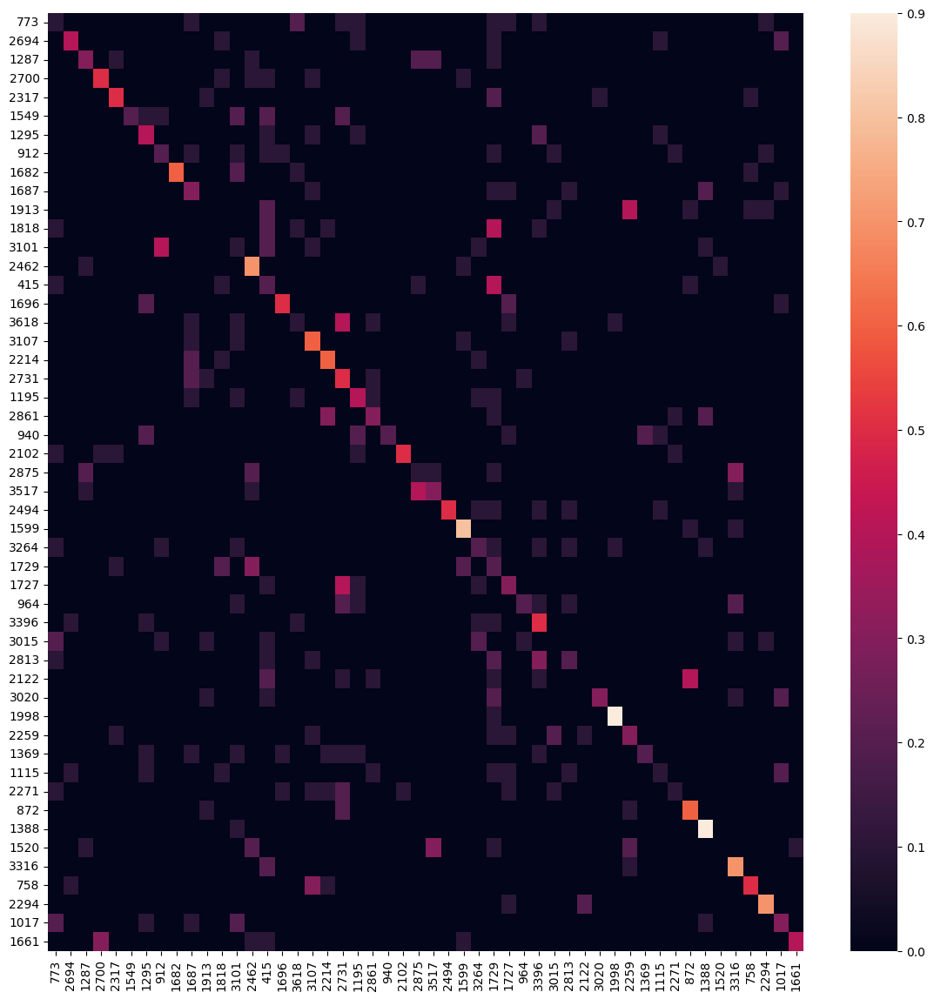

In [15]:
scaler = StandardScaler().fit(x_test)
x_test_scaled = scaler.transform(x_test)
predictions = results.predict(x_test_scaled)
report = classification_report(y_test, predictions, output_dict=True)
accuracy = accuracy_score(y_test, predictions)

# report["weighted avg"]["accuracy"] = accuracy
v_ids = list(set(pseudonym_video_id_map.values()) and set(y_test))
cm = confusion_matrix(y_test, predictions, labels = v_ids )
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
# report["cm"] = cm_normalized.tolist()
# test_fn = re.search(r"/Test/(.*)", test_fp).group(1)
# evaluation_test_fn = self.evaluation_folder+test_fn[:-9]+"-eval-test.json"
# with open(evaluation_test_fn, "w") as f: 
plt.subplots(figsize=(14, 14))

sns.heatmap(cm_normalized, yticklabels=v_ids, xticklabels=v_ids)

In [16]:
pd.DataFrame(report).T

,precision,recall,f1-score,support
415,0.090909,0.20,0.125000,10.00
758,0.625000,0.50,0.555556,10.00
773,0.090909,0.10,0.095238,10.00
872,0.461538,0.60,0.521739,10.00
912,0.222222,0.20,0.210526,10.00
940,1.000000,0.20,0.333333,10.00
964,0.500000,0.20,0.285714,10.00
1017,0.272727,0.30,0.285714,10.00
1115,0.200000,0.10,0.133333,10.00
1195,0.307692,0.40,0.347826,10.00


#### Open-World Model

In [ ]:

# Example usage with cross-validation
from sklearn.datasets import load_iris

# Load the Iris dataset (or use your own dataset)
data = load_iris()
X = data.data
y = data.target

class_labels = np.unique(y)

# Create the OneVsRestClassifier with Logistic Regression as the base estimator
ovr_classifier = OneVsRestClassifier(LogisticRegression())

# Predict probabilities for all classes using cross-validation
probabilities = cross_val_predict(ovr_classifier, X, y, cv=5, method='predict_proba')

# Find the class with the highest probability for each sample
predicted_labels = np.argmax(probabilities, axis=1)
max_probabilities = np.max(probabilities, axis=1)

# Set a threshold (0.5) for considering the prediction as "unknown"
unknown_mask = max_probabilities <= 0.5
predicted_labels[unknown_mask] = -1  # Use a negative value to represent "unknown"

# Evaluate performance using cross-validation
accuracy = accuracy_score(y[predicted_labels != -1], predicted_labels[predicted_labels != -1])
print(f"Accuracy (excluding 'unknown'): {accuracy:.2f}")


In [ ]:


# train, test = log_reg_modeller.train_test_split(train_frame=datasets["train"], test_frame=datasets["test"], ow=True)

# train_trans, train_target = log_reg_modeller.transform_data(train, "mpdf")

# features = log_reg_modeller.extract_features_from_df(train_trans, train_target)

# selected_features, features_dict = log_reg_modeller.select_features_from_df(features)

# y_train = features.y
# x_train = selected_features
# x_train


test_trans, test_target = log_reg_modeller.transform_data(test, "mpdf")
features_test = log_reg_modeller.extract_features_from_df(data_frame=test_trans, target=test_target ,features_dict=features_dict)
features_test = features_test[list(selected_features.columns ) + ["y"]]
y_test = features_test
x_test = features_test.drop("y", axis=1)



In [ ]:
# Simple OVA classifier for OW and CW, compare performance with these features

model = OneVsRestClassifier(LogisticRegression( max_iter=2000))
#model = LogisticRegression(multi_class='multinomial', solver='lbfgs',  max_iter=2000)

# Define evaluation
scoring = ['precision_macro', 'recall_macro', 'accuracy', 'f1_macro']
#cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

scaler = StandardScaler().fit(x_train)
x_train_scaled = scaler.transform(x_train)

"""
Source: ChatGPT: 
Prompts 
I have a one-vs all logistic regression classifier. However, I want the model to return "unknown" if none of the classifiers predict a class with a probability higher than 50%. At the same Tim I want to use cross-validation. How can I do that using python?
Can you do this using the OneVsRestClassifier from sklearn?
"""

# Predict probabilities for all classes using cross-validation
probabilities = cross_val_predict(estimator=model, X=x_train_scaled, y=y_train, cv=5, method='predict_proba')

# Get the class with highest probability for each sample
predicted_labels = np.argmax(probabilities, axis=1)
max_probabilities = np.max(probabilities, axis=1)

model = model.fit(x_train_scaled, y_train.apply(int))
predicted_labels = [classes[x] for x in predicted_labels]

classes = model.classes_
# Threshold for predicting  "unknown" (-1)
unknown_mask = max_probabilities <= 0.5
predicted_labels[unknown_mask] = -1 

accuracy = accuracy_score(y_train, predicted_labels)
print(f"Accuracy (excluding 'unknown'): {accuracy:.2f}")


# # evaluate the model and collect the scores
# train_scores = cross_validate(estimator=model, X=x_train_scaled, y=y_train, scoring=scoring, cv=cv)
# train_scores_dict = {str.replace(k, "test_", ""):{
#                         "mean": np.mean(train_scores[k]),
#                         "std": np.std(train_scores[k])
#                         }
#                         for k in train_scores.keys()
#                     }
# print("Validation complete")

# print("Fitting model")
# print("Fitting complete")

In [ ]:
accuracy = accuracy_score(y_train, predicted_labels)
print(f"Accuracy (excluding 'unknown'): {accuracy:.2f}")

In [ ]:
accuracy = accuracy_score(y_train[predicted_labels != -1], predicted_labels[predicted_labels != -1])
print(f"Accuracy (excluding 'unknown'): {accuracy:.2f}")

In [ ]:
y_train

In [ ]:
pd.DataFrame(train_scores_dict)

In [ ]:
#   def key_encoder(obj):
#         """
#         Custom JSON encoder function to convert numeric keys represented as strings to actual numbers.
#         """
#         if isinstance(obj, str):
#             if obj.isnumeric():
#                 return int(obj)
#         return obj
    
#     def train(self, onevsrest=False, cross_val=False, train_df=None):
#         start_time = datetime.now()
#         train = train_df if isinstance(train_df, pd.DataFrame) else pd.read_csv( self.train_file )

#         x_train = train.drop( 'y', axis = 1 ).values
#         y_train = train.y.values

#         if(onevsrest):
#             model = OneVsRestClassifier(LogisticRegression())
#         else:
#             model = LogisticRegression(multi_class='multinomial', solver='lbfgs',  max_iter=2000)
#         print("Model created.")

#         # define the model evaluation procedure
#         scoring = ['precision_macro', 'recall_macro', 'accuracy', 'f1_macro']
#         cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

#         scaler = StandardScaler().fit(x_train)
#         x_train_scaled = scaler.transform(x_train)

#         #train_fn = re.search(r"/Train/(.*)", self.train_file).group(1)

#         if(cross_val):
#             print("Begin validation")
#             # evaluate the model and collect the scores
#             train_scores = cross_validate(model, x_train_scaled, y_train, scoring=scoring, cv=cv, n_jobs=-1)
#             train_scores_dict = {str.replace(k, "test_", ""):{
#             "mean": np.mean(train_scores[k]),
#             "std": np.std(train_scores[k])
#             }
#                 for k in train_scores.keys()
#             }
#             evaluation_train_fn = self.evaluation_folder+str(start_time.timestamp)+train_fn[:-10]+"-eval-train.json"
#             with open(evaluation_train_fn, "w") as f: 
#                 json.dump(train_scores_dict, f, indent=4, sort_keys=True, default=self.key_encoder)
#             print("Validation complete")

#         self.model = model

#         print("Fitting model")
#         results = model.fit(x_train_scaled, y_train)
#         self.model_fitted = model
#         print("Fitting complete")
#         model_fn = self.model_dir+str(start_time.timestamp)+train_fn[:-10]+"-lr-model.joblib"
#         joblib.dump(model, model_fn)
#         print("Model saved as: ", model_fn)
     
#         end_time = datetime.now()
#         exicution_time = end_time  - start_time
#         m = int(exicution_time.seconds / 60)
#         s = exicution_time.seconds % 60
#         print(f"Training completed in: {m}:{s}")
#         return ( model, pd.DataFrame(train_scores_dict)) if(cross_val) else (model, results)


### Feature Engineering

For logistic regression the features must have low multicolinearity, there should be less correlation between the features and the residuals should be normally distributed. Althoug a reduction from 784 to 355 is a lot, 355 featurers are still quite a bit. We are now examining, if we can reduce that more. 

In [17]:
selected_features

,"0__change_quantiles__f_agg_""mean""__isabs_True__qh_1.0__ql_0.4","0__change_quantiles__f_agg_""mean""__isabs_True__qh_0.8__ql_0.4","0__change_quantiles__f_agg_""var""__isabs_True__qh_1.0__ql_0.4","0__change_quantiles__f_agg_""var""__isabs_True__qh_0.8__ql_0.4","0__change_quantiles__f_agg_""var""__isabs_False__qh_1.0__ql_0.4","0__change_quantiles__f_agg_""var""__isabs_False__qh_0.8__ql_0.4","0__change_quantiles__f_agg_""mean""__isabs_True__qh_0.6__ql_0.4","0__change_quantiles__f_agg_""var""__isabs_False__qh_0.6__ql_0.4","0__change_quantiles__f_agg_""var""__isabs_True__qh_0.6__ql_0.4","0__change_quantiles__f_agg_""mean""__isabs_False__qh_0.8__ql_0.4",...,"0__fft_coefficient__attr_""real""__coeff_13","0__fft_coefficient__attr_""imag""__coeff_12","0__fft_coefficient__attr_""angle""__coeff_7","0__fft_coefficient__attr_""imag""__coeff_3",0__partial_autocorrelation__lag_3,"0__fft_coefficient__attr_""imag""__coeff_11","0__cwt_coefficients__coeff_6__w_2__widths_(2, 5, 10, 20)","0__fft_coefficient__attr_""abs""__coeff_5","0__fft_coefficient__attr_""real""__coeff_8",0__value_count__value_0
1829,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,...,-0.743121,-0.037010,-37.755752,2.269099,0.317308,0.207048,-0.527737,0.918573,0.152387,1.0
409,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,...,1.561149,2.400116,-151.604852,0.061463,0.597340,-2.146232,-0.208424,1.560577,-5.712221,0.0
1513,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,...,-5.290293,-2.273196,176.142287,-1.016367,0.004887,-3.933999,-0.650956,0.498571,-1.574819,0.0
863,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,...,2.105348,0.842103,-107.629407,2.445542,0.636836,1.001317,0.100194,0.676392,-5.023793,0.0
1867,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,...,-4.201293,-1.252601,131.895588,-0.788518,0.204979,-1.796644,-1.215643,1.505288,1.087947,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
459,0.000018,0.000018,4.350680e-09,4.350680e-09,4.350680e-09,4.350680e-09,0.000018,4.350680e-09,4.350680e-09,0.000018,...,5.975927,4.465349,91.865035,-0.440950,0.320488,-1.809739,-0.874560,1.727423,0.848769,0.0
1447,0.000031,0.000031,1.073109e-08,1.073109e-08,1.073109e-08,1.073109e-08,0.000031,1.073109e-08,1.073109e-08,0.000031,...,-4.225279,-2.355504,-6.389653,4.525556,0.270523,3.260573,0.350504,2.253085,-0.343895,0.0
1472,0.000036,0.000036,1.843734e-08,1.843734e-08,1.843734e-08,1.843734e-08,0.000036,1.843734e-08,1.843734e-08,0.000036,...,3.758825,4.442751,-73.001662,-0.225649,0.361355,-0.729567,-0.305899,0.972923,-3.185622,0.0
260,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,...,1.347214,-0.475720,139.544871,1.809451,0.271089,1.246670,-0.794689,0.685656,-1.428529,0.0


#### Multicolinearity

In [18]:
# VIF sccores

def calc_vif(df):
    vif = pd.DataFrame()
    vif["variables"] = df.columns
    vif_list = [] 
    for i in range(df.shape[1]):
        if i %20 ==0: print(f"Progress: {round(i/df.shape[1]*100)}%")
        if i %20 ==19: clear_output()
        vif_list.append(variance_inflation_factor(df.values, i) )
    vif["VIF"] = vif_list
    return(vif)


In [19]:
vif_scores = calc_vif(selected_features)
vif_scores.sort_values("VIF", ascending=False) 


Progress: 96%


,variables,VIF
106,0__mean_abs_change,42188.190962
108,"0__change_quantiles__f_agg_""mean""__isabs_True_...",42025.444566
76,"0__cwt_coefficients__coeff_9__w_20__widths_(2,...",37902.650550
48,"0__cwt_coefficients__coeff_9__w_10__widths_(2,...",36999.922023
69,0__cwt_coefficients__coeff_11__w_20__widths_(2...,34797.327452
...,...,...
155,0__partial_autocorrelation__lag_6,1.164279
354,0__value_count__value_0,1.057644
299,0__partial_autocorrelation__lag_9,1.020798
282,0__partial_autocorrelation__lag_8,1.003806


In [20]:
low_vif_features = vif_scores["variables"][vif_scores["VIF"]<10]
selected_features_2 = selected_features[low_vif_features]
vif_scores_2 = calc_vif(selected_features_2)
vif_scores_2.sort_values("VIF", ascending=False) 

Progress: 84%


,variables,VIF
20,0__approximate_entropy__m_2__r_0.7,7.925910
47,0__approximate_entropy__m_2__r_0.5,6.164863
44,"0__agg_linear_trend__attr_""stderr""__chunk_len_...",5.362747
19,0__approximate_entropy__m_2__r_0.9,4.891525
53,0__fourier_entropy__bins_3,4.493589
...,...,...
87,0__partial_autocorrelation__lag_8,1.002806
85,0__index_mass_quantile__q_0.8,0.643103
9,"0__agg_linear_trend__attr_""intercept""__chunk_l...",0.069415
33,0__minimum,0.023708


In [21]:
low_vif_features = vif_scores_2["variables"]

#### Correlation

In [22]:
low_vif_features_df = selected_features[low_vif_features]
correlation_matrix = low_vif_features_df.corr()

<Axes: >

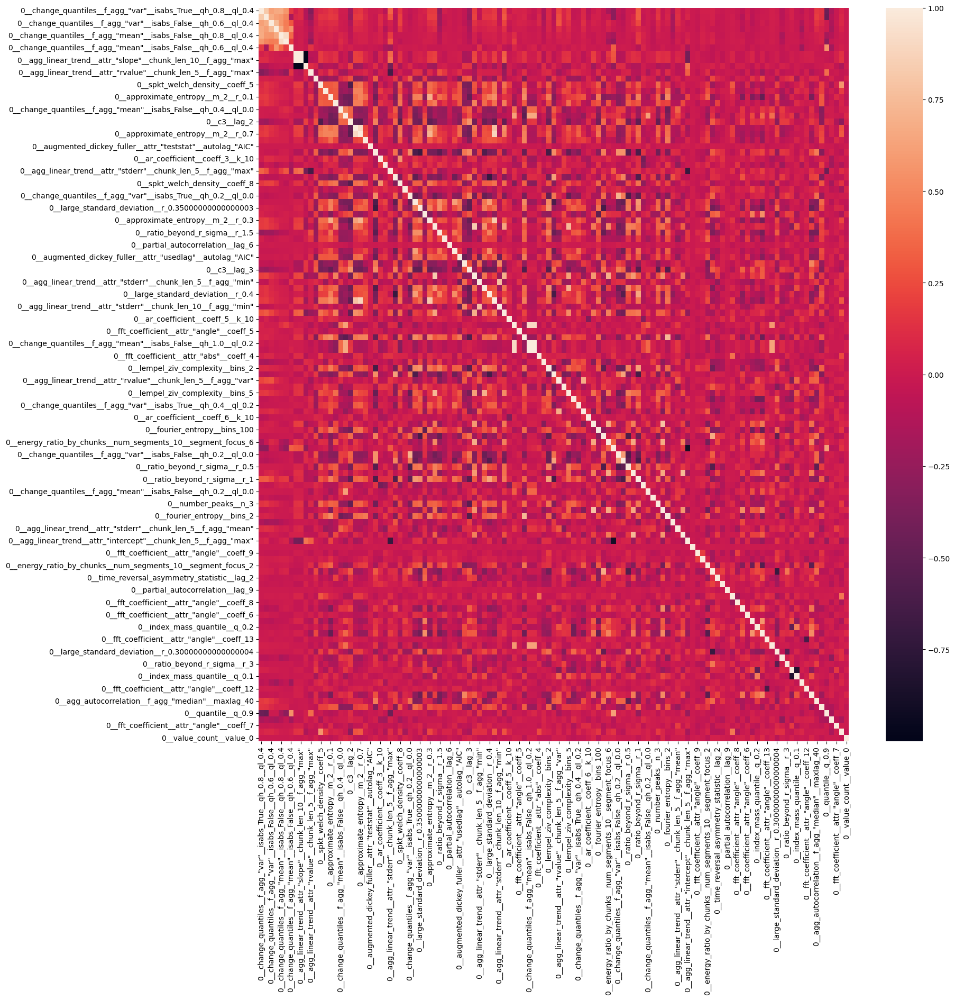

In [23]:
plt.figure(figsize=(18,18))
sns.heatmap(correlation_matrix)


In [24]:
# Source: ChatGPT
# Find the variables with the highest correlation
n = len(correlation_matrix.columns)
correlation_pairs = []

for i in range(n):
    for j in range(i + 1, n):
        feature1, feature2 = correlation_matrix.columns[i], correlation_matrix.columns[j]
        correlation = correlation_matrix.iloc[i, j]
        correlation_pairs.append((feature1, feature2, correlation))

# Sort the correlation pairs by absolute correlation (highest to lowest)
correlation_pairs.sort(key=lambda x: abs(x[2]), reverse=True)

# Print the pairs with the highest correlation coefficients
num_pairs_to_display = 20  # Change this value to display more or fewer pairs
for i in range(min(num_pairs_to_display, len(correlation_pairs))):
    feature1, feature2, correlation = correlation_pairs[i]
    print(f"{feature1} - {feature2}: {correlation:.4f}")

0__agg_linear_trend__attr_"slope"__chunk_len_10__f_agg_"max" - 0__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"max": -0.9997
0__change_quantiles__f_agg_"mean"__isabs_False__qh_1.0__ql_0.2 - 0__change_quantiles__f_agg_"mean"__isabs_False__qh_0.8__ql_0.2: 0.9976
0__agg_linear_trend__attr_"stderr"__chunk_len_10__f_agg_"max" - 0__agg_linear_trend__attr_"slope"__chunk_len_10__f_agg_"max": 0.9930
0__agg_linear_trend__attr_"stderr"__chunk_len_10__f_agg_"max" - 0__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"max": -0.9899
0__change_quantiles__f_agg_"mean"__isabs_False__qh_0.8__ql_0.4 - 0__change_quantiles__f_agg_"mean"__isabs_False__qh_1.0__ql_0.4: 0.9190
0__change_quantiles__f_agg_"mean"__isabs_False__qh_0.6__ql_0.2 - 0__change_quantiles__f_agg_"mean"__isabs_False__qh_0.8__ql_0.2: 0.9089
0__change_quantiles__f_agg_"mean"__isabs_False__qh_0.6__ql_0.2 - 0__change_quantiles__f_agg_"mean"__isabs_False__qh_1.0__ql_0.2: 0.9071
0__approximate_entropy__m_2__r_0.9 - 0__approxim

In [25]:
high_correlation_features = [cp[0] for cp in correlation_pairs if abs(cp[2])>0.6]
print(len(high_correlation_features))

69


In [26]:
keep_features = list(set(low_vif_features) - set(high_correlation_features))
print(len(keep_features))
better_features_df = selected_features[keep_features]


78


<Axes: >

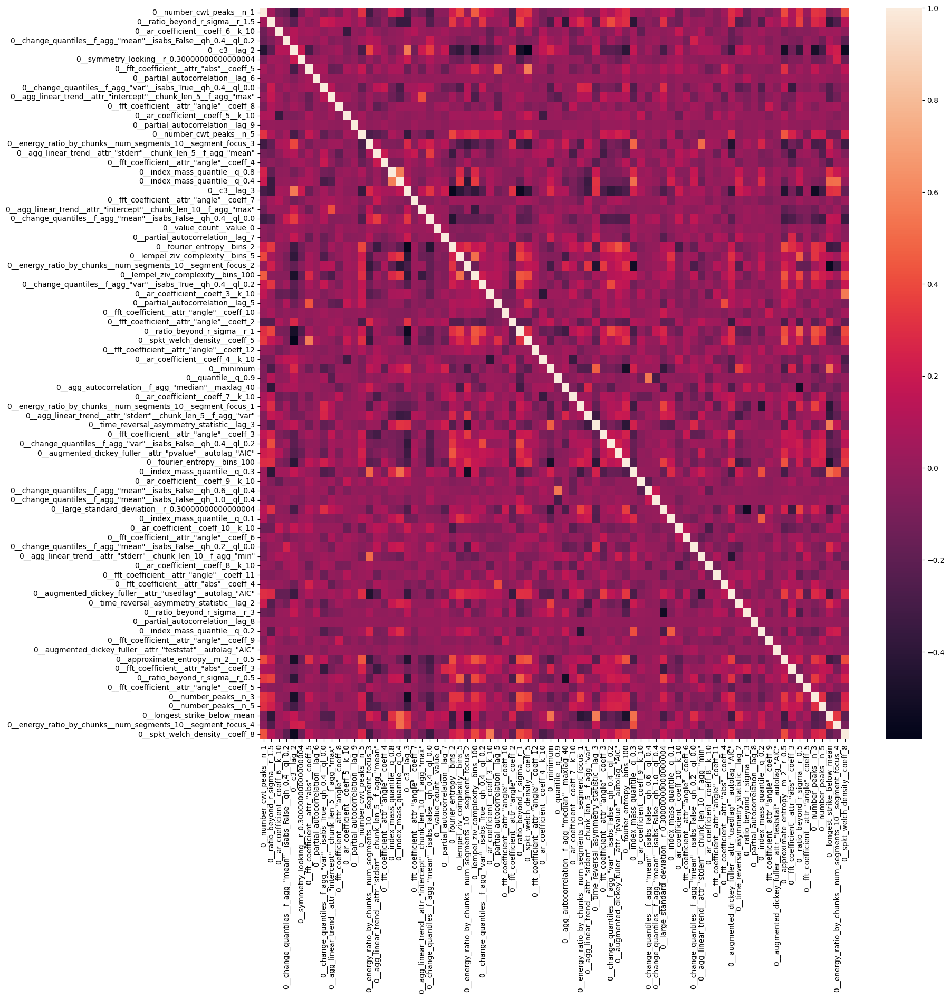

In [27]:
better_features_cm =better_features_df.corr()
plt.figure(figsize=(18,18))
sns.heatmap(better_features_cm)

#### PCA

In [6]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd


# Standardizing the features
x = StandardScaler().fit_transform(selected_features)

# Apply PCA
pca = PCA(n_components=4)
principalComponents = pca.fit_transform(x, features.y)


<Axes: xlabel='0', ylabel='1'>

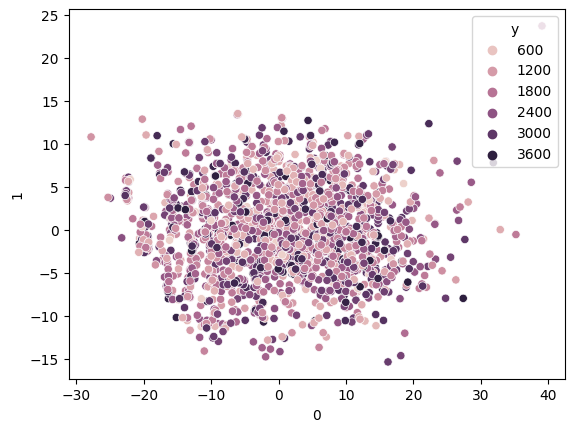

In [7]:
pc = pd.DataFrame(principalComponents, columns=[i for i in range(principalComponents.shape[1])])
pc["y"] = features.y

sns.scatterplot(data=pc, x=0, y=1, hue="y")

In [271]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # Import the 3D plotting module
from IPython.display import display
import ipywidgets as widgets

#plt.switch_backend(matplotlib.backends.)

# Example DataFrame with three columns for three classes
classes = pc["y"].unique()
classes = np.random.choice(classes,5)
class_dfs = [ ]
for c in classes[:5]:
    df = pc[pc["y"] == c]
    class_dfs.append(df)

def create_3d_scatter_plot(elevation, azimuth):
    # Create a 3D scatter plot
    fig = plt.figure(figsize=(8,8))
    ax = fig.add_subplot(111, projection='3d')

    for i in range(len(class_dfs)):
        ax.scatter(class_dfs[i][0], class_dfs[i][1], class_dfs[i][2], label='Video '+str(classes[i]))

    # Set labels and title
    ax.set_xlabel('PC 1')
    ax.set_ylabel('PC 2')
    ax.set_zlabel('PC 3')
    ax.set_title('Principal components of data')

    # Set view angles based on widget values
    ax.view_init(elev=elevation, azim=azimuth)

    # Show the legend
    ax.legend()

    # Show the plot
    plt.show()

# Create interactive widgets for elevation and azimuth angles
elevation_widget = widgets.FloatSlider(min=-90, max=90, value=30, step=5, description='Elevation')
azimuth_widget = widgets.FloatSlider(min=-180, max=180, value=30, step=5, description='Azimuth')

# Create a button to update the plot with the current widget values
button = widgets.Button(description='Update Plot')

# Function to update the plot based on the widget values
def update_plot(_):
    create_3d_scatter_plot(elevation_widget.value, azimuth_widget.value)
    plt.show()

button.on_click(update_plot)

# Display the widgets and button
display(elevation_widget, azimuth_widget, button)

# Initialize the plot
create_3d_scatter_plot(elevation_widget.value, azimuth_widget.value)


FloatSlider(value=30.0, description='Elevation', max=90.0, min=-90.0, step=5.0)

FloatSlider(value=30.0, description='Azimuth', max=180.0, min=-180.0, step=5.0)

Button(description='Update Plot', style=ButtonStyle())

/tmp/ipykernel_55450/3990661571.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(8,8))


In [283]:
plt.close()

Exception in Tkinter callback
Traceback (most recent call last):
  File "/usr/lib/python3.10/tkinter/__init__.py", line 1921, in __call__
    return self.func(*args)
  File "/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/matplotlib/backends/_backend_tk.py", line 552, in destroy
    Gcf.destroy(self)
  File "/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/matplotlib/_pylab_helpers.py", line 66, in destroy
    manager.destroy()
  File "/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/matplotlib/backends/_backend_tk.py", line 587, in destroy
    delayed_destroy()
  File "/home/deborahdarragh/Documents/Gitlab_Deborah/youtube_video_detector/modelling_environment/lib/python3.10/site-packages/matplotlib/backends/_backend_tk.py", line 577, in delayed_destroy
    self.window.destroy

TclError: can't invoke "destroy" command: application has been destroyed

In [ ]:
# Create an CW Logistic Regression Model 1VA for OW and CW


# Run the model once on the input to get a baseline

# OW test


# Feature engineering

    # Best FP: sdf, mpdf

    # ---------------


# Again Try the model performance OW, CW

# Conclusions